In [2]:
import matplotlib.pyplot as plt
import os
import glob
import numpy as np
import json
import pandas as pd
from collections import defaultdict
%matplotlib notebook

In [3]:
results_root = '/home/romilb/research/msr/results/profiling/20200102_2037'
result_dir = '/home/romilb/research/msr/results/profiling/20200102_2037/plots/'
os.makedirs(result_dir, exist_ok=True)

In [4]:
city_names = os.listdir(results_root)
if "plots" in city_names:
    city_names.remove("plots")
print(city_names)

['zurich', 'stuttgart', 'darmstadt', 'dusseldorf', 'monchengladbach', 'aachen']


In [5]:
def get_data(json_path):
    with open(json_path) as json_file:
        data = json.load(json_file)
    task_ids, accs = zip(*data['test_acc'].items())
    task_ids = [int(x) for x in task_ids]
    return task_ids, accs

<IPython.core.display.Javascript object>


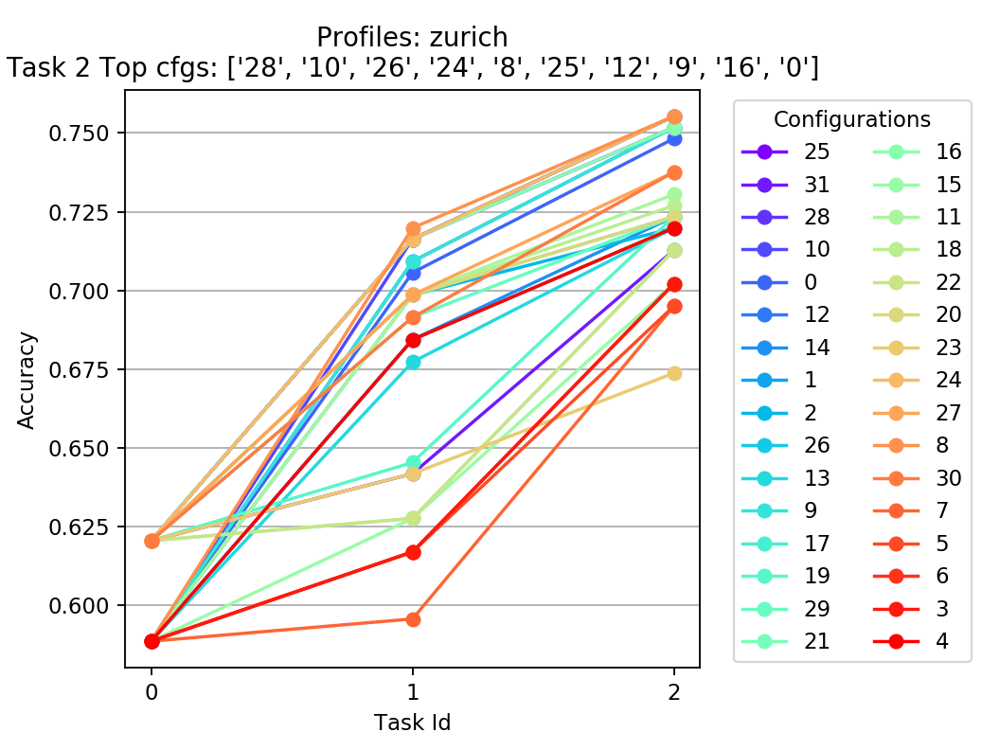

<IPython.core.display.Javascript object>


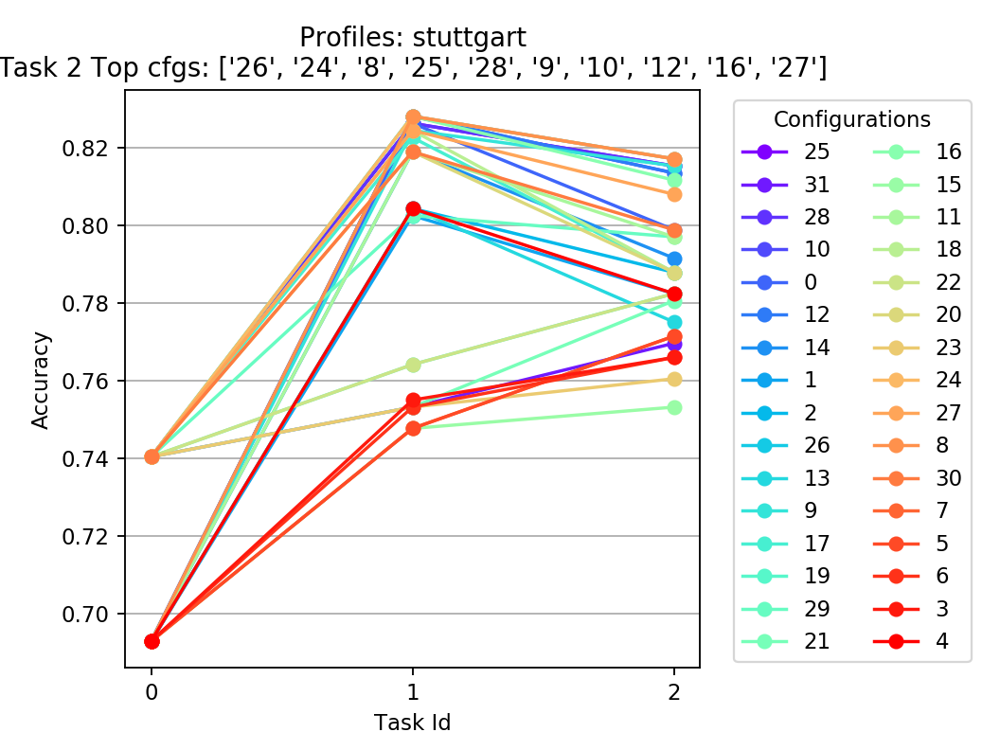

<IPython.core.display.Javascript object>


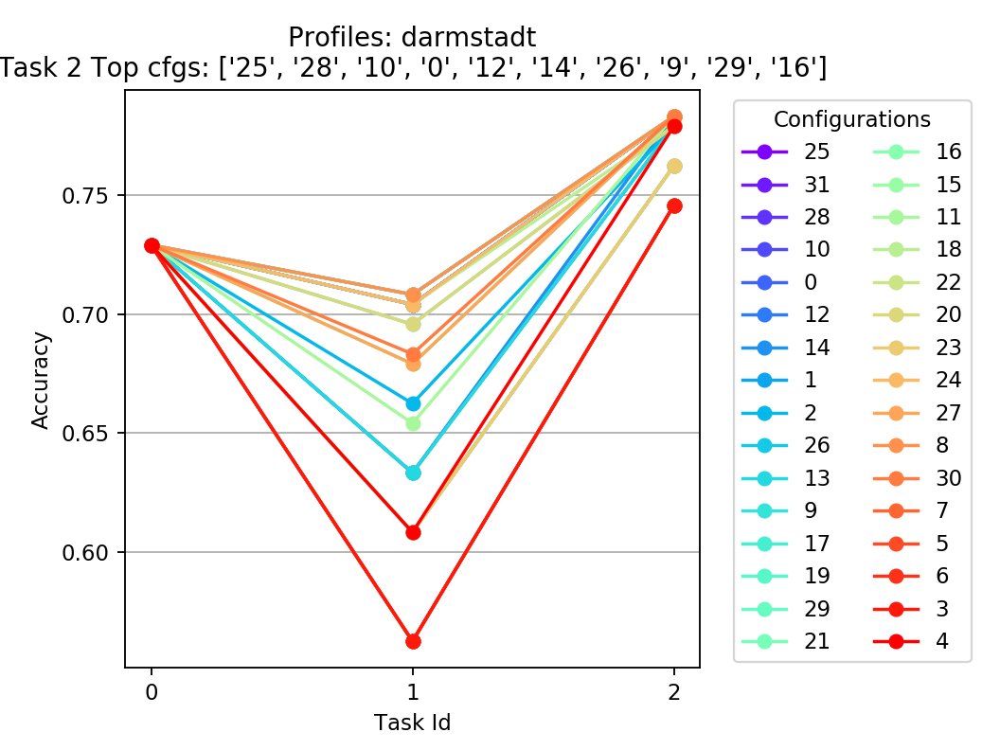

<IPython.core.display.Javascript object>


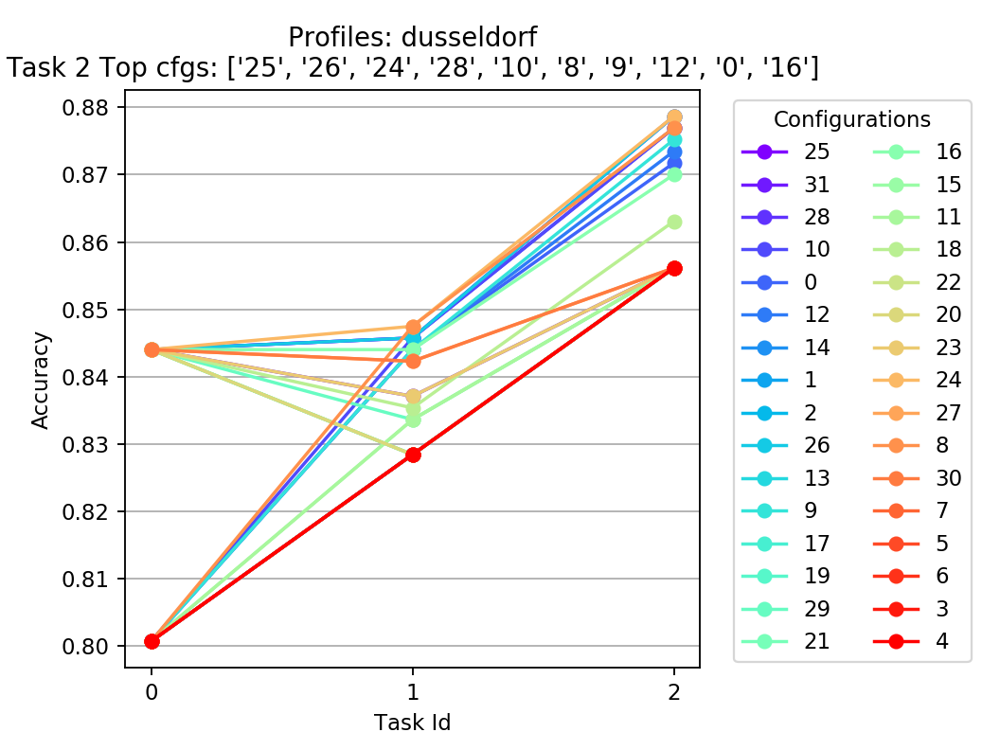

<IPython.core.display.Javascript object>


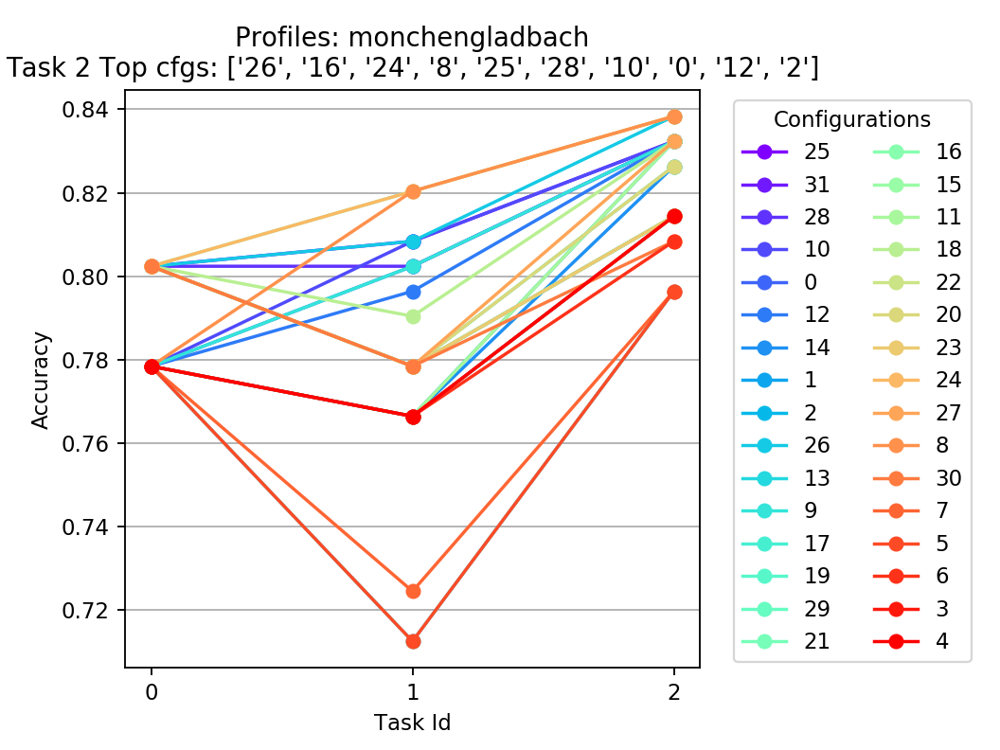

<IPython.core.display.Javascript object>


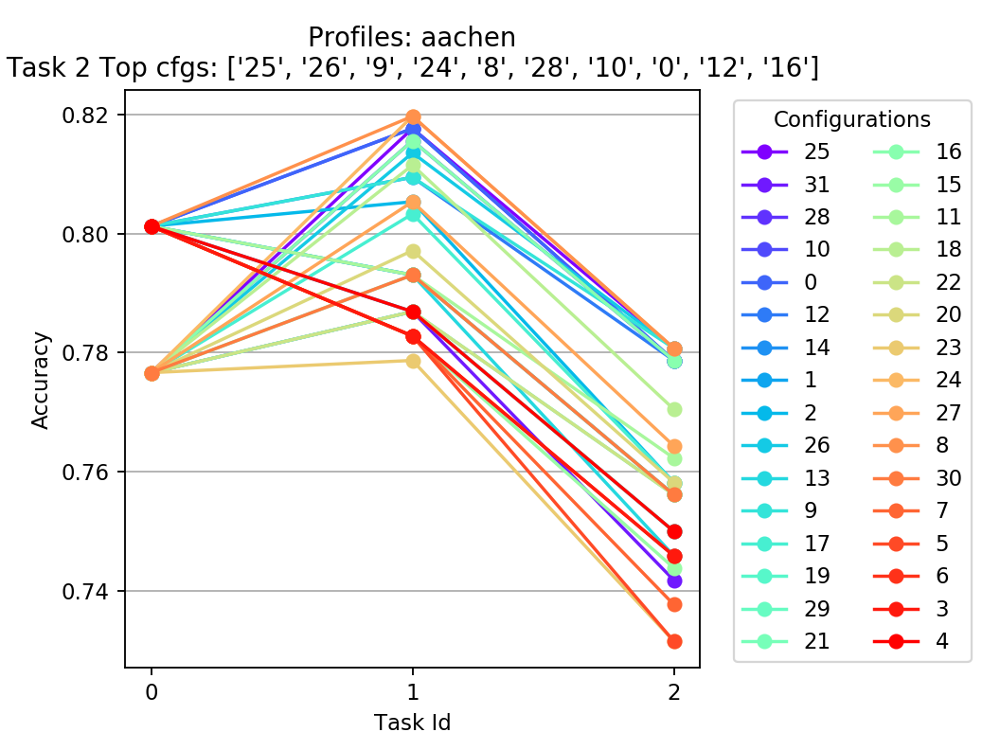

<IPython.core.display.Javascript object>


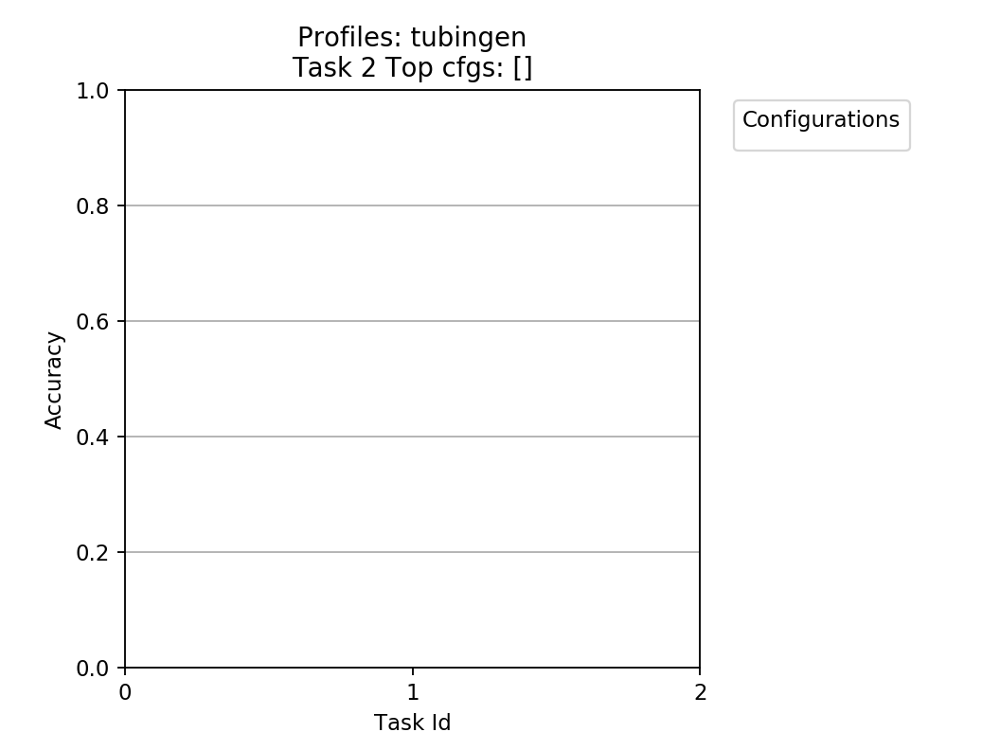

No handles with labels found to put in legend.


In [66]:
def get_top5(taskwise_acc_dict, taskid, topk=5):
    data = taskwise_acc_dict[taskid]
    hp_ids = sorted(data, key=data.get, reverse=True)[:topk]
    return hp_ids, [data[i] for i in hp_ids]
    
for city in city_names:
    plt.figure()
    city_path = os.path.join(results_root, city)
    retrain_result_files = (glob.glob(city_path + "/*_retraining_result.json"))
    hyperparam_ids = [os.path.basename(x).split('_retraining_result.json')[0] for x in retrain_result_files]
    
    colors = iter(plt.cm.rainbow(np.linspace(0,1,len(hyperparam_ids))))

    taskwise_acc = defaultdict(dict)
    for hp_id in hyperparam_ids:
        x,y = get_data(os.path.join(city_path, '{}_retraining_result.json'.format(hp_id)))
        plt.plot(x,y, label=hp_id, marker='o', color=next(colors))
        for t, acc in zip(x,y):
            taskwise_acc[t][hp_id] = acc
        
    task2_top, _ = get_top5(taskwise_acc, 2, topk=10)
    plt.title("Profiles: {}\nTask 2 Top cfgs: {}".format(city, task2_top))
    plt.ylabel("Accuracy")
    plt.xlabel("Task Id")
    num_tasks = len(x)
    plt.xticks(np.arange(num_tasks), [str(x) for x in range(num_tasks)])
    plt.gca().yaxis.grid(True)
    plt.subplots_adjust(right=0.7)
    plt.legend(bbox_to_anchor=(1.04,1), loc="upper left", ncol=2, title="Configurations")
    plt.savefig(os.path.join(result_dir, '{}.png'.format(city)))

In [27]:
hyperparam_ids

['25',
 '31',
 '28',
 '10',
 '0',
 '12',
 '14',
 '1',
 '2',
 '26',
 '13',
 '9',
 '17',
 '19',
 '29',
 '21',
 '16',
 '15',
 '11',
 '18',
 '22',
 '20',
 '23',
 '24',
 '27',
 '8',
 '30',
 '7',
 '5',
 '6',
 '3',
 '4']

# Compare the effect of subsampling

## When subsample is separate directory:

In [9]:
subsample_root = '/home/romilb/research/msr/results/profiling/subsamplealldata_0.2/'
full_root = '/home/romilb/research/msr/results/profiling/20200106_1927'#20200102_2037'
result_dir = os.path.join(subsample_root, 'plot_compare')
os.makedirs(result_dir, exist_ok=True)

city_names = os.listdir(full_root)
if "plots" in city_names:
    city_names.remove("plots")
print(city_names)

['zurich', 'stuttgart', 'darmstadt', 'dusseldorf', 'monchengladbach', 'aachen']


<IPython.core.display.Javascript object>


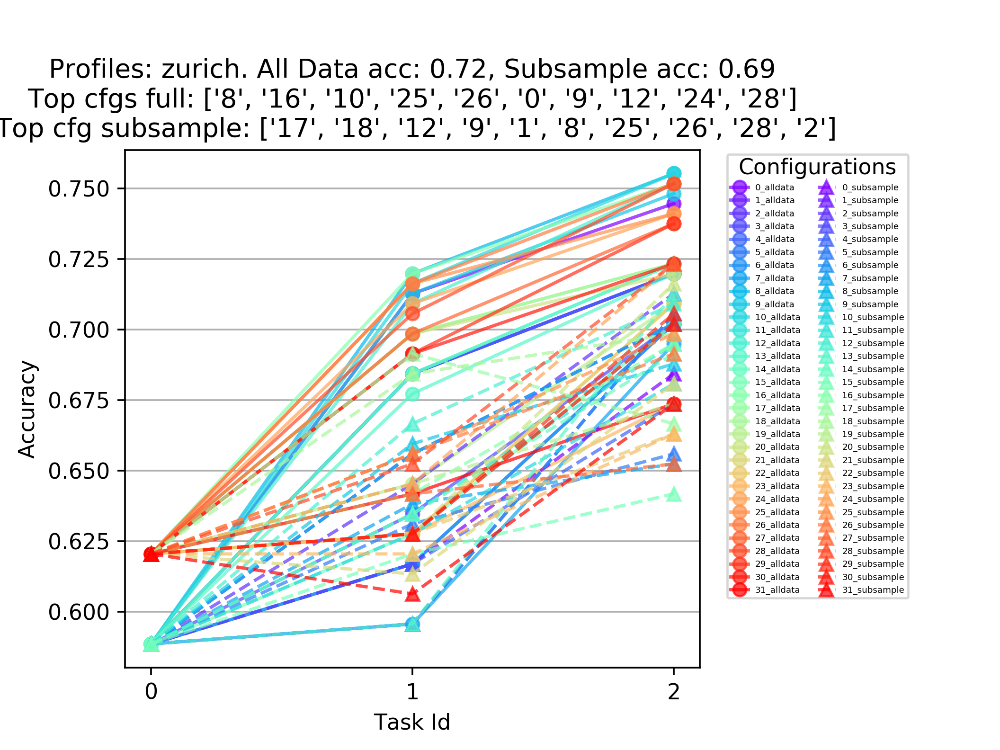

Intersection: ['26', '28', '12', '25', '9', '8']
Full max acc:	0.72
Subsample Max acc:	0.69
Jaccard: 0.42857142857142855


<IPython.core.display.Javascript object>


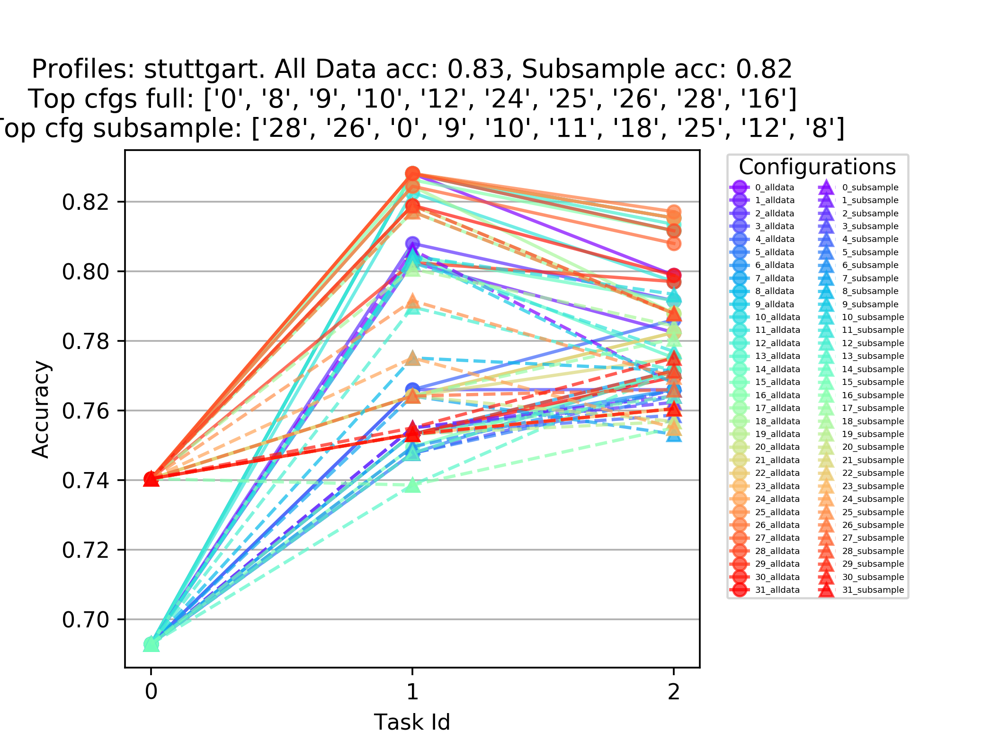

Intersection: ['26', '28', '12', '25', '10', '9', '8', '0']
Full max acc:	0.83
Subsample Max acc:	0.82
Jaccard: 0.6666666666666666


<IPython.core.display.Javascript object>


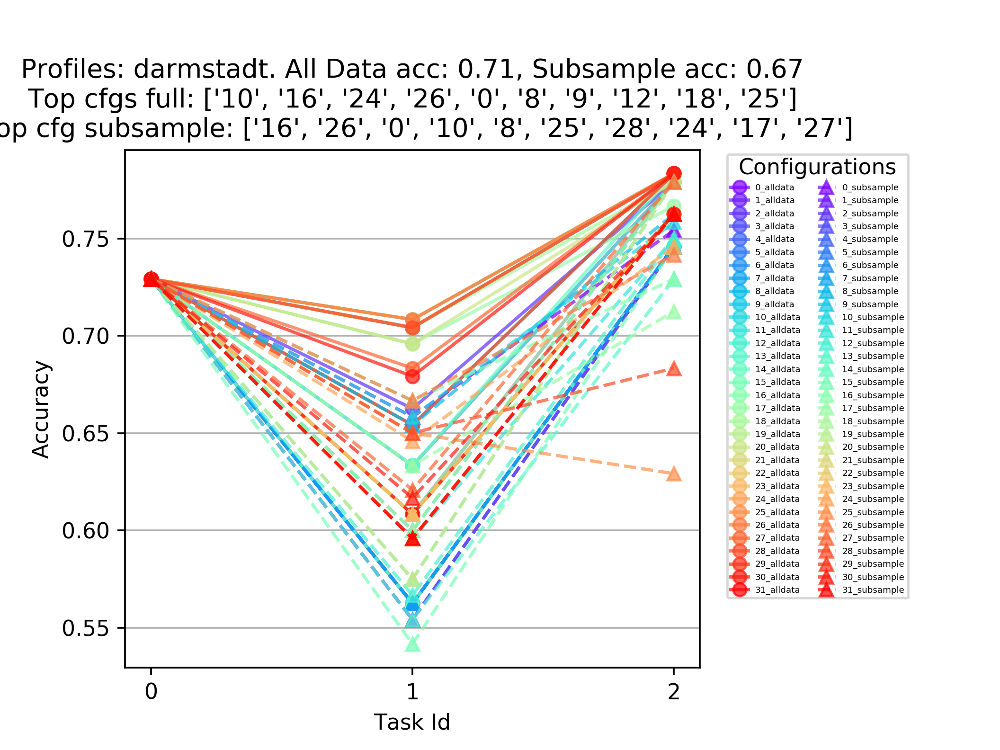

Intersection: ['26', '16', '25', '10', '8', '0', '24']
Full max acc:	0.71
Subsample Max acc:	0.67
Jaccard: 0.5384615384615384


<IPython.core.display.Javascript object>


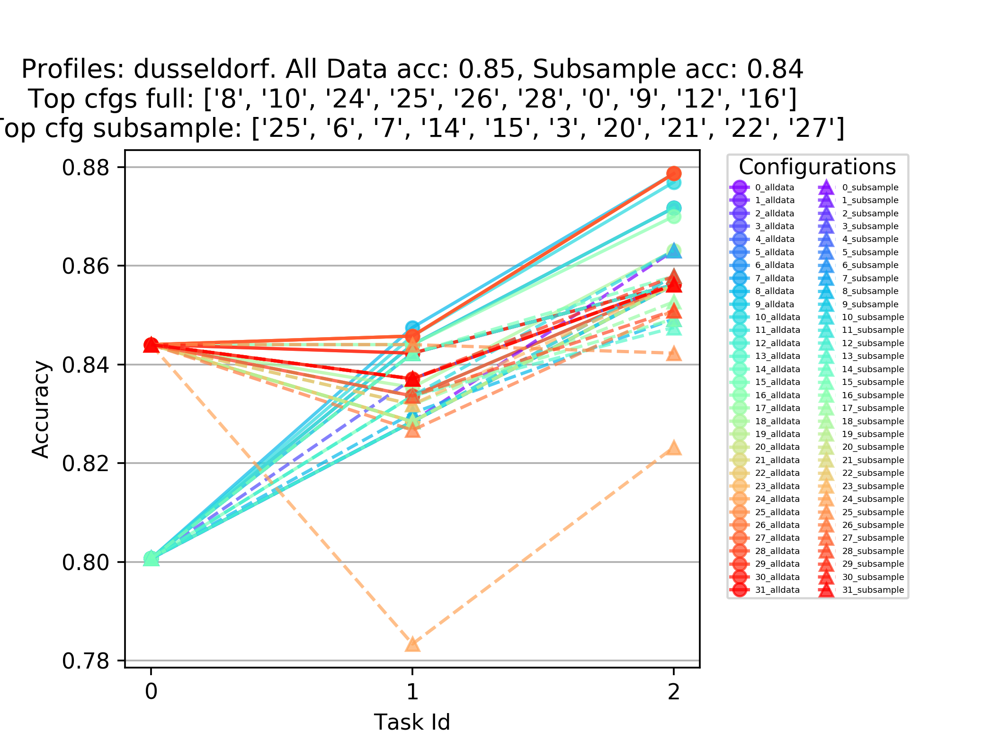

Intersection: ['25']
Full max acc:	0.85
Subsample Max acc:	0.84
Jaccard: 0.05263157894736842


<IPython.core.display.Javascript object>


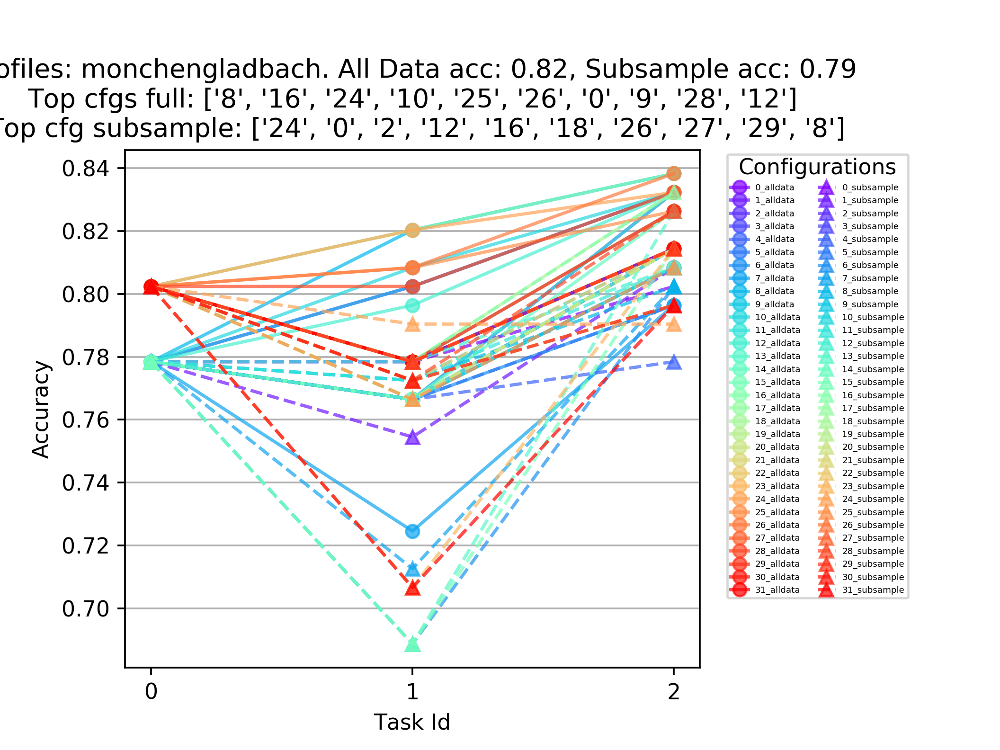

Intersection: ['26', '12', '16', '8', '0', '24']
Full max acc:	0.82
Subsample Max acc:	0.79
Jaccard: 0.42857142857142855


<IPython.core.display.Javascript object>


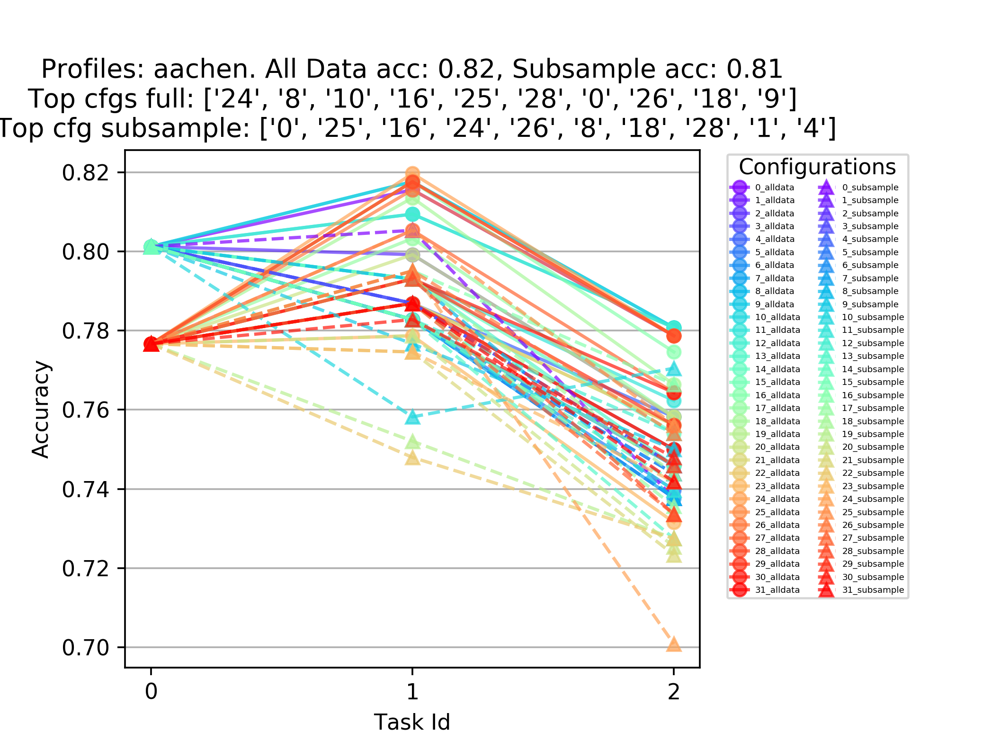

Intersection: ['26', '28', '16', '25', '18', '8', '0', '24']
Full max acc:	0.82
Subsample Max acc:	0.81
Jaccard: 0.6666666666666666


In [18]:
def get_top5(taskwise_acc_dict, taskid, topk=5):
    data = taskwise_acc_dict[taskid]
    hp_ids = sorted(data, key=data.get, reverse=True)[:topk]
    return hp_ids, [data[i] for i in hp_ids]
    
for city in city_names:
    plt.figure(dpi=200)
    
    # Plot full data sample data
    city_path = os.path.join(full_root, city)
    retrain_result_files = (glob.glob(city_path + "/*_retraining_result.json"))
    hyperparam_ids = sorted([os.path.basename(x).split('_retraining_result.json')[0] for x in retrain_result_files],
                           key=int)
    
    colors = iter(plt.cm.rainbow(np.linspace(0,1,len(hyperparam_ids))))
    taskwise_acc = defaultdict(dict)
    for hp_id in hyperparam_ids:
        x,y = get_data(os.path.join(city_path, '{}_retraining_result.json'.format(hp_id)))
        plt.plot(x,y, label=hp_id + "_alldata", marker='o', color=next(colors), alpha=0.7)
        for t, acc in zip(x,y):
            taskwise_acc[t][hp_id] = acc
    topk_full, accs_full = get_top5(taskwise_acc, 1, topk=10)
    
    colors = iter(plt.cm.rainbow(np.linspace(0,1,len(hyperparam_ids))))
    taskwise_acc = defaultdict(dict)
    city_path = os.path.join(subsample_root, city)
    for hp_id in hyperparam_ids:
        x,y = get_data(os.path.join(city_path, '{}_retraining_result.json'.format(hp_id)))
        plt.plot(x,y, label=hp_id + "_subsample", marker='^', ls='--', color=next(colors), alpha=0.7)
        for t, acc in zip(x,y):
            taskwise_acc[t][hp_id] = acc
    topk_subsample, accs_subsample = get_top5(taskwise_acc, 1, topk=10)
        
    #task2_top, _ = get_top5(taskwise_acc, 2, topk=10)
    plt.title("Profiles: {}. All Data acc: {:.2f}, Subsample acc: {:.2f}\nTop cfgs full: {}\n Top cfg subsample: {}".format(city, accs_full[0], accs_subsample[0], topk_full, topk_subsample))
    print("Intersection: {}\nFull max acc:\t{:.2f}\nSubsample Max acc:\t{:.2f}".format(list(set(topk_full) & set(topk_subsample)),
         accs_full[0], accs_subsample[0]))
    print("Jaccard: {}".format(len(list(set(topk_full) & set(topk_subsample)))/len(list(set(topk_full+topk_subsample)))))
    plt.ylabel("Accuracy")
    plt.xlabel("Task Id")
    num_tasks = len(x)
    plt.xticks(np.arange(num_tasks), [str(x) for x in range(num_tasks)])
    plt.gca().yaxis.grid(True)
    plt.subplots_adjust(top=0.8, right=0.7)
    plt.legend(bbox_to_anchor=(1.04,1), loc="upper left", ncol=2, title="Configurations", prop={'size': 4})
    plt.savefig(os.path.join(result_dir, '{}.png'.format(city)))

## When subsample is in same directory

In [58]:
data_root = '/home/romilb/research/msr/results/profiling/20200110_0807'#20200110_0643'#20200102_2037'
result_dir = os.path.join(data_root, 'plot')
os.makedirs(result_dir, exist_ok=True)

city_names = os.listdir(data_root)
if "plots" in city_names:
    city_names.remove("plots")
if "plot" in city_names:
    city_names.remove("plot")
if "plot_compare" in city_names:
    city_names.remove("plot_compare")
print(city_names)

['zurich', 'stuttgart', 'darmstadt', 'dusseldorf', 'monchengladbach', 'aachen', 'tubingen', 'bochum', 'bremen', 'cologne', 'ulm', 'jena', 'strasbourg', 'hamburg', 'krefeld', 'weimar']


<IPython.core.display.Javascript object>


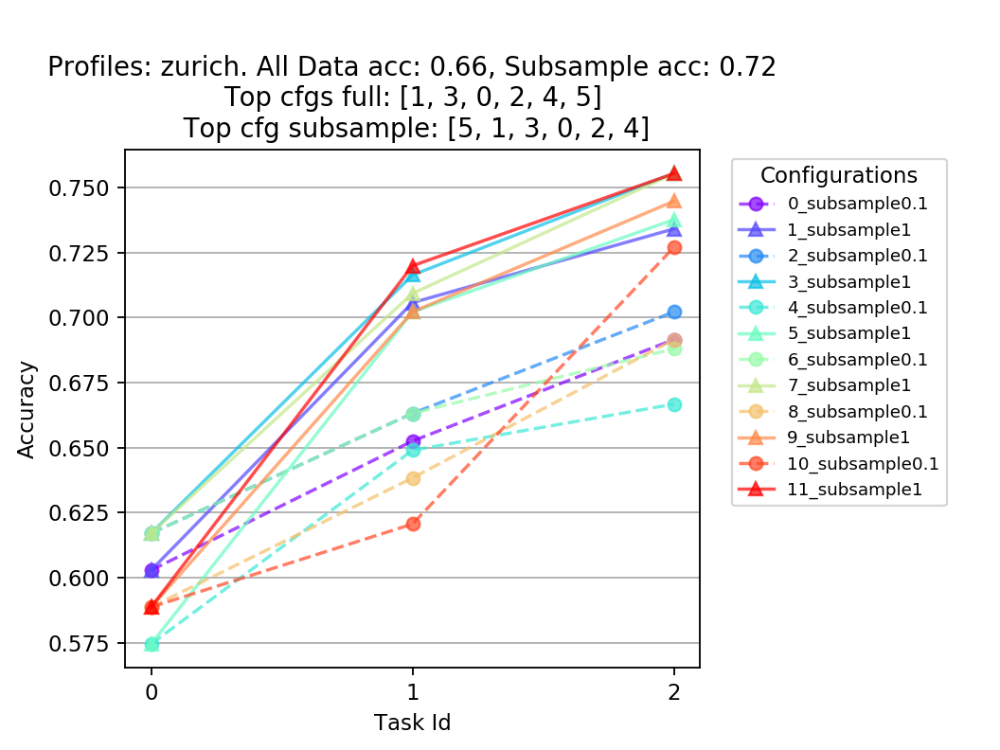

Intersection: [0, 1, 2, 3, 4, 5]
Full max acc:	0.66
Subsample Max acc:	0.72
Jaccard: 1.0


<IPython.core.display.Javascript object>


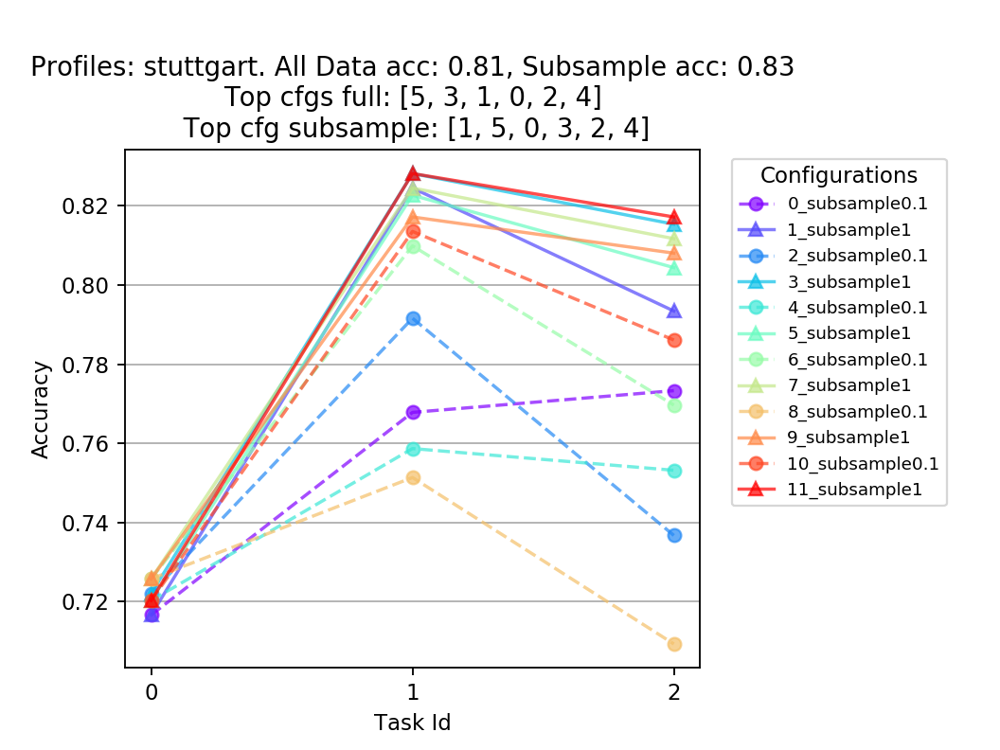

Intersection: [0, 1, 2, 3, 4, 5]
Full max acc:	0.81
Subsample Max acc:	0.83
Jaccard: 1.0


<IPython.core.display.Javascript object>


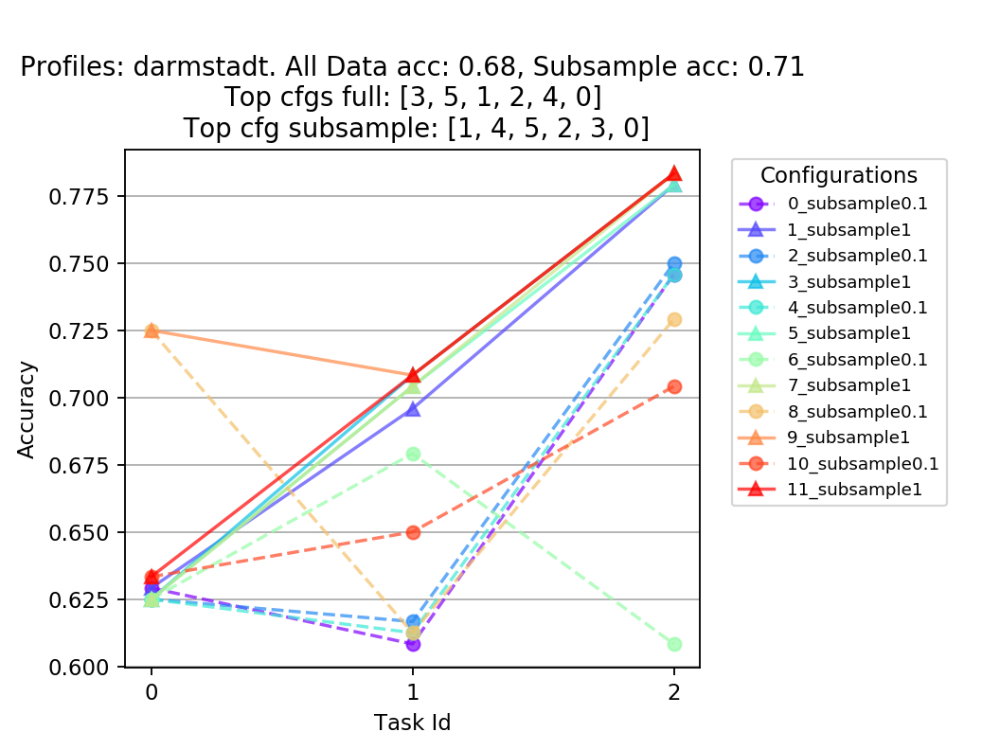

Intersection: [0, 1, 2, 3, 4, 5]
Full max acc:	0.68
Subsample Max acc:	0.71
Jaccard: 1.0


<IPython.core.display.Javascript object>


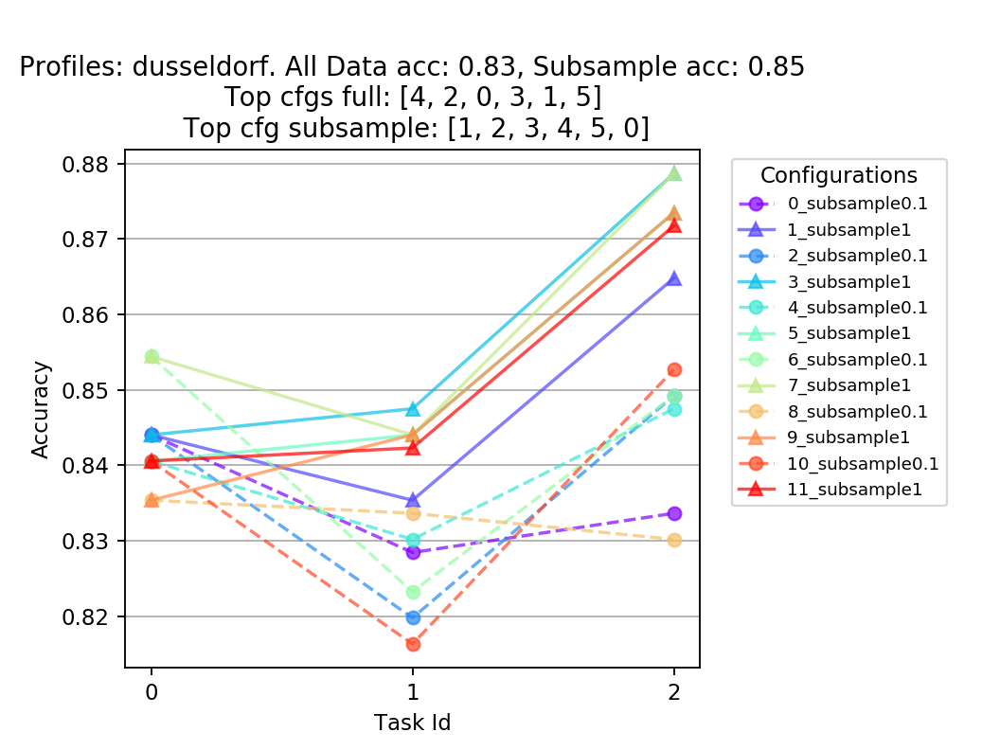

Intersection: [0, 1, 2, 3, 4, 5]
Full max acc:	0.83
Subsample Max acc:	0.85
Jaccard: 1.0


<IPython.core.display.Javascript object>


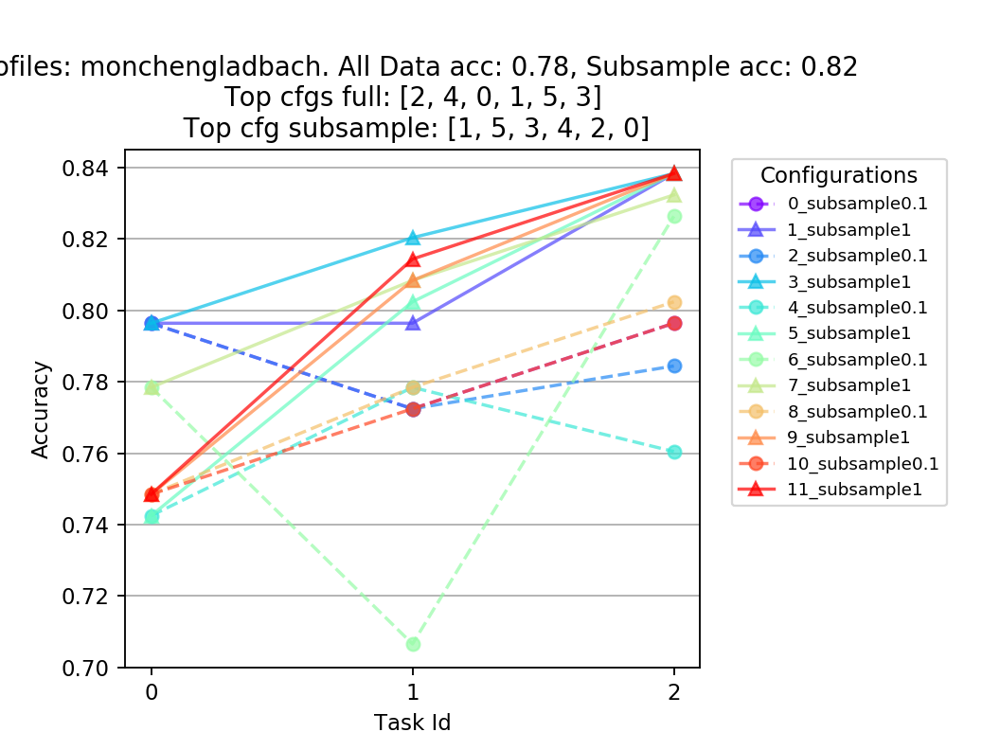

Intersection: [0, 1, 2, 3, 4, 5]
Full max acc:	0.78
Subsample Max acc:	0.82
Jaccard: 1.0


<IPython.core.display.Javascript object>


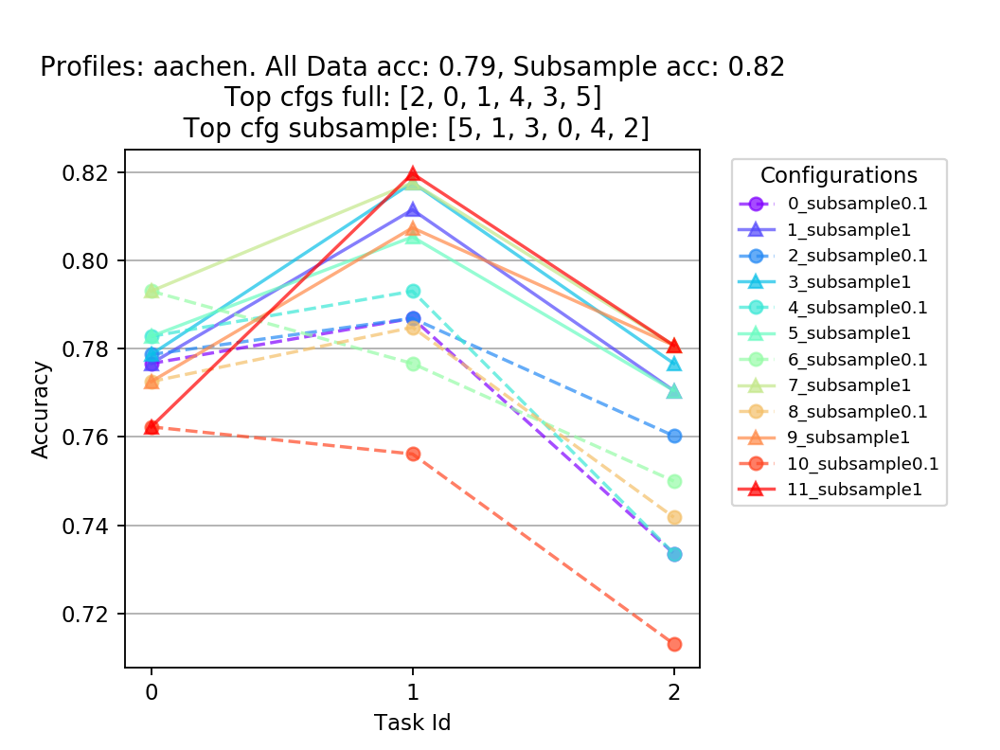

Intersection: [0, 1, 2, 3, 4, 5]
Full max acc:	0.79
Subsample Max acc:	0.82
Jaccard: 1.0


<IPython.core.display.Javascript object>


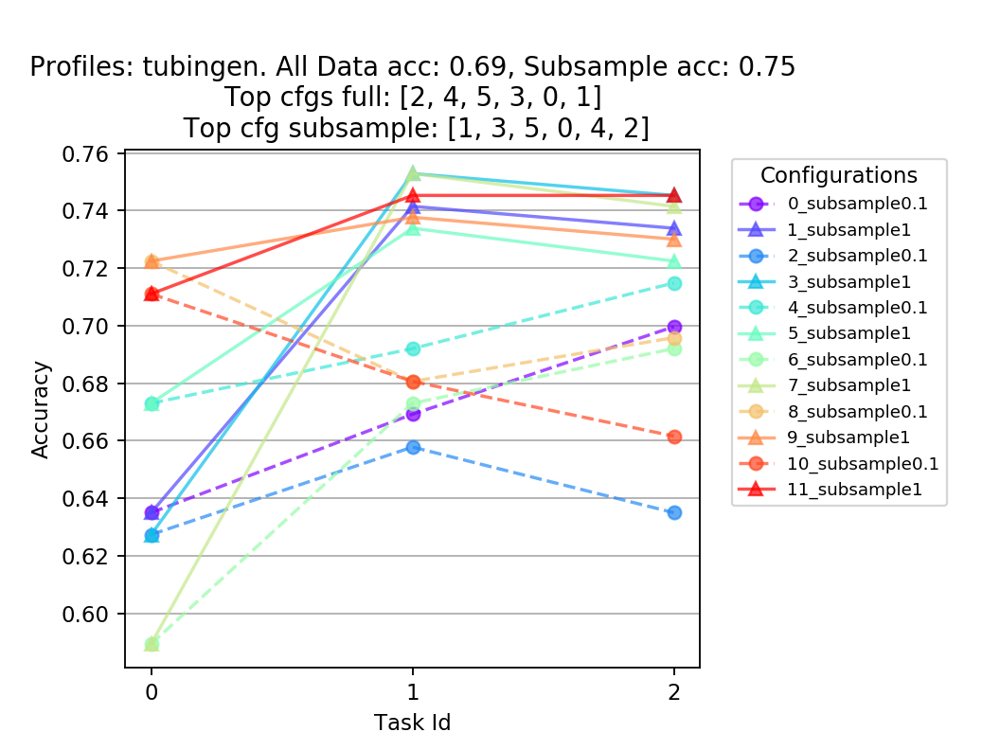

Intersection: [0, 1, 2, 3, 4, 5]
Full max acc:	0.69
Subsample Max acc:	0.75
Jaccard: 1.0


<IPython.core.display.Javascript object>


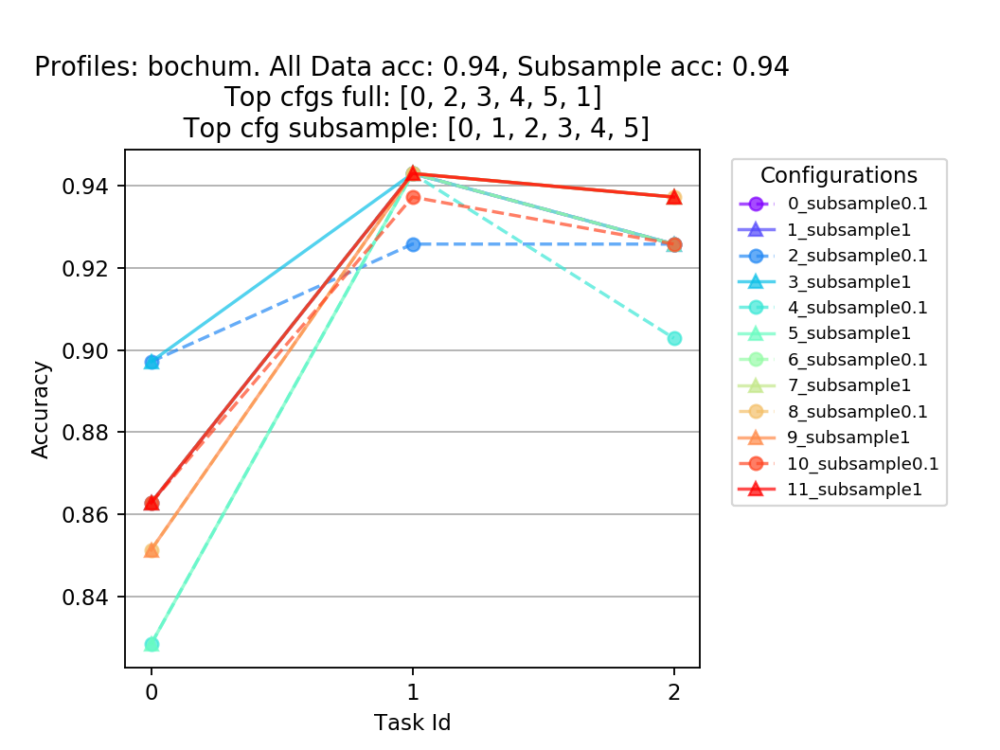

Intersection: [0, 1, 2, 3, 4, 5]
Full max acc:	0.94
Subsample Max acc:	0.94
Jaccard: 1.0


<IPython.core.display.Javascript object>


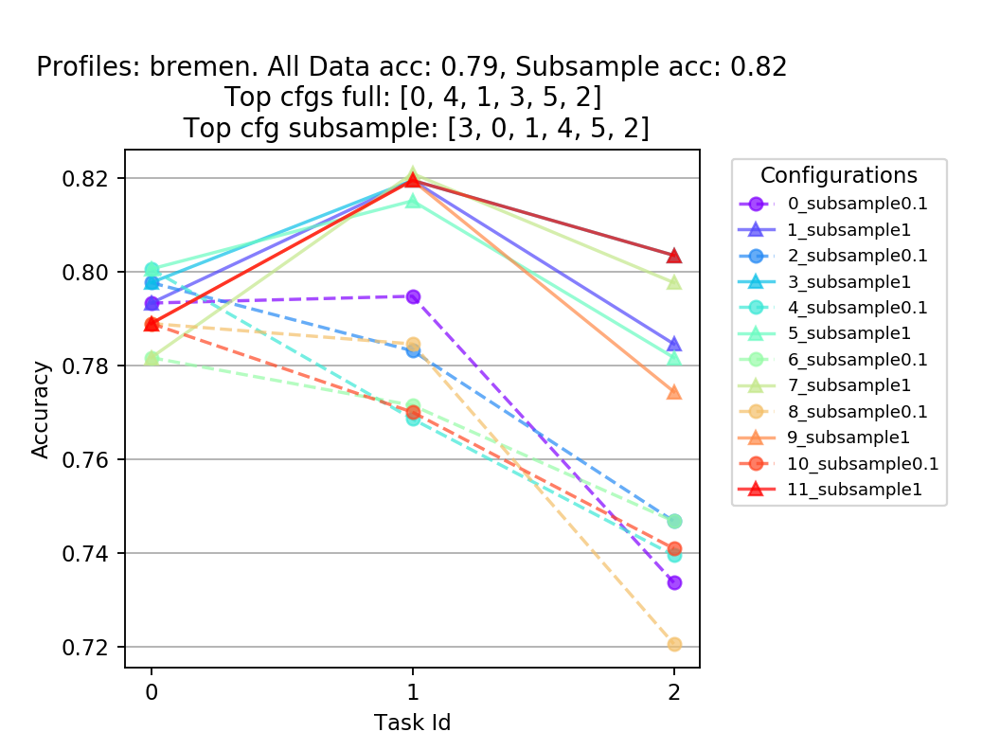

Intersection: [0, 1, 2, 3, 4, 5]
Full max acc:	0.79
Subsample Max acc:	0.82
Jaccard: 1.0


<IPython.core.display.Javascript object>


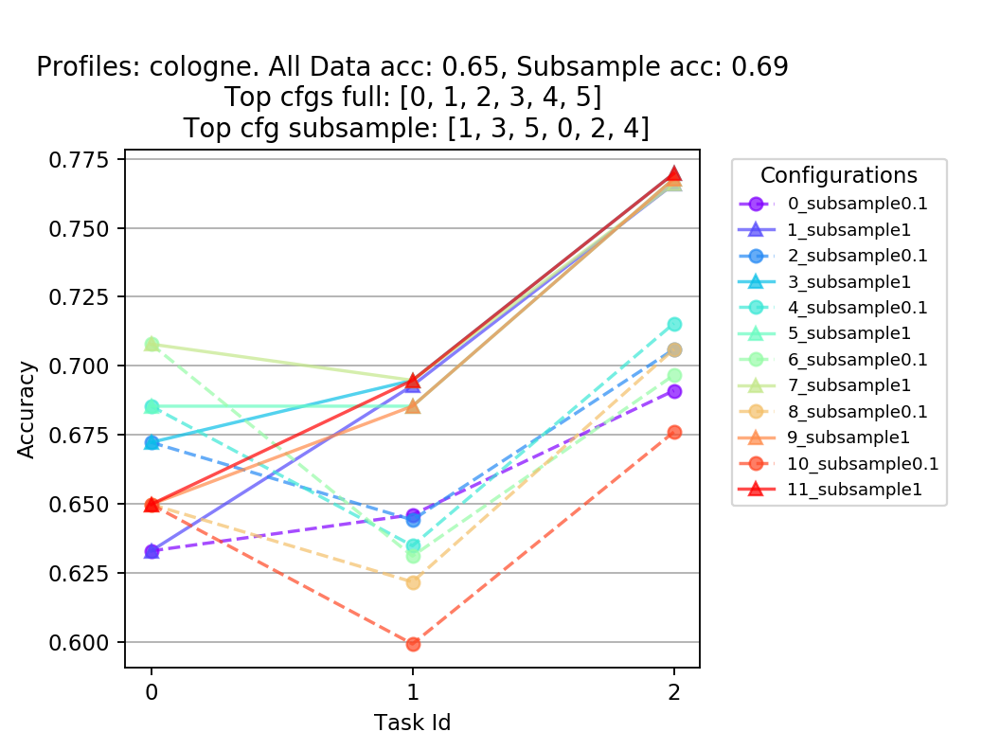

Intersection: [0, 1, 2, 3, 4, 5]
Full max acc:	0.65
Subsample Max acc:	0.69
Jaccard: 1.0


<IPython.core.display.Javascript object>


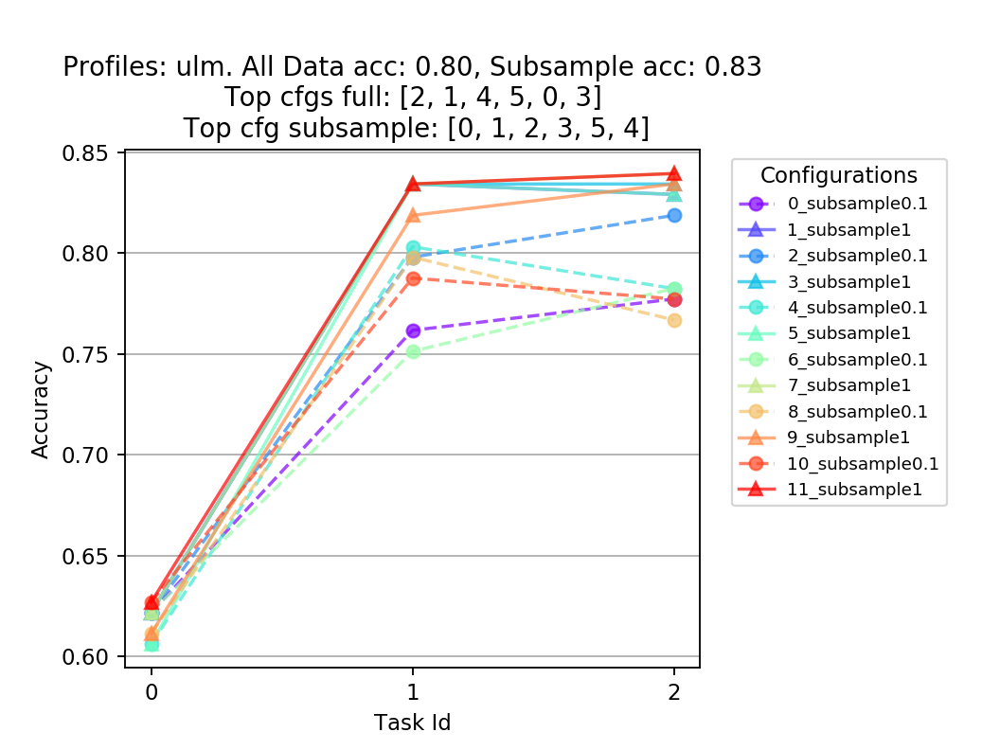

Intersection: [0, 1, 2, 3, 4, 5]
Full max acc:	0.80
Subsample Max acc:	0.83
Jaccard: 1.0


<IPython.core.display.Javascript object>


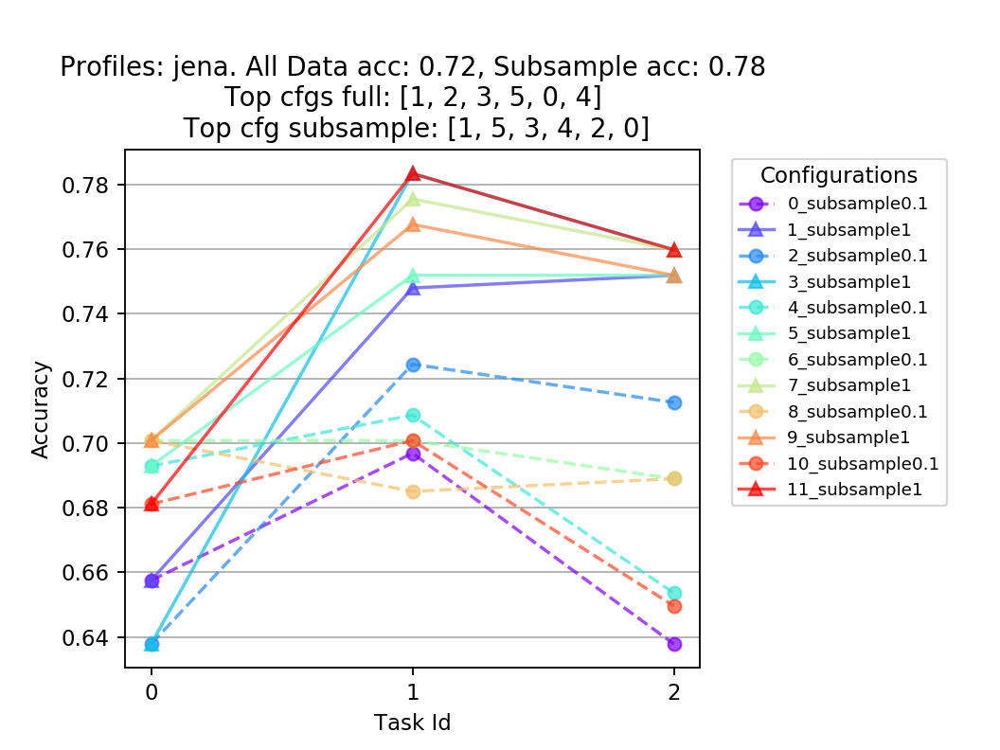

Intersection: [0, 1, 2, 3, 4, 5]
Full max acc:	0.72
Subsample Max acc:	0.78
Jaccard: 1.0


<IPython.core.display.Javascript object>


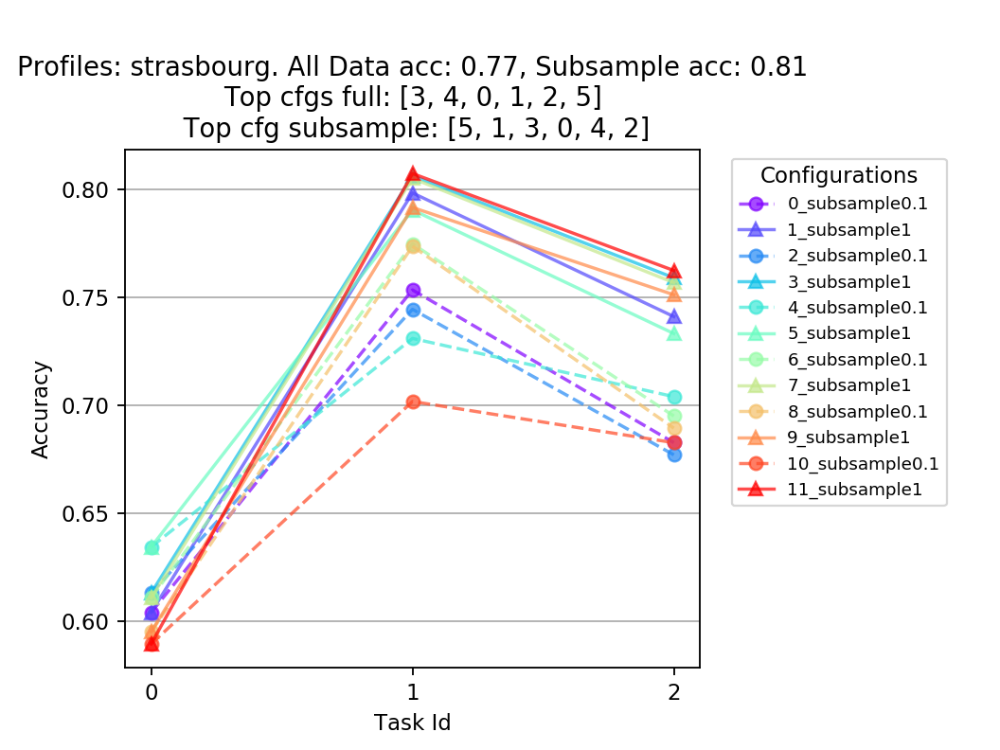

Intersection: [0, 1, 2, 3, 4, 5]
Full max acc:	0.77
Subsample Max acc:	0.81
Jaccard: 1.0


<IPython.core.display.Javascript object>


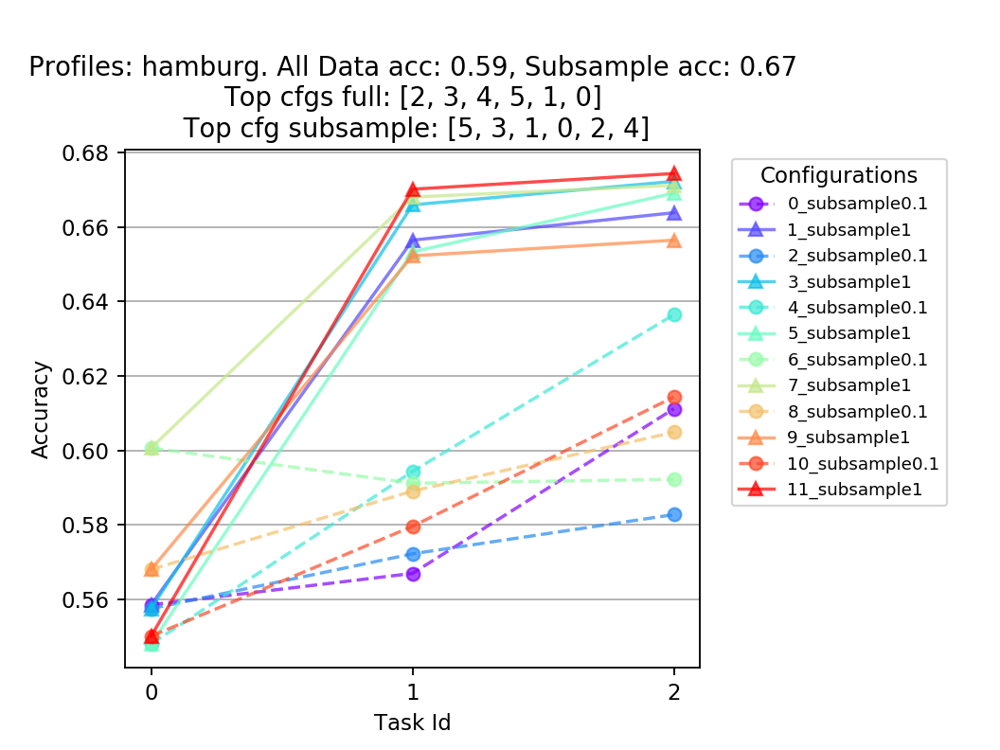

Intersection: [0, 1, 2, 3, 4, 5]
Full max acc:	0.59
Subsample Max acc:	0.67
Jaccard: 1.0


<IPython.core.display.Javascript object>


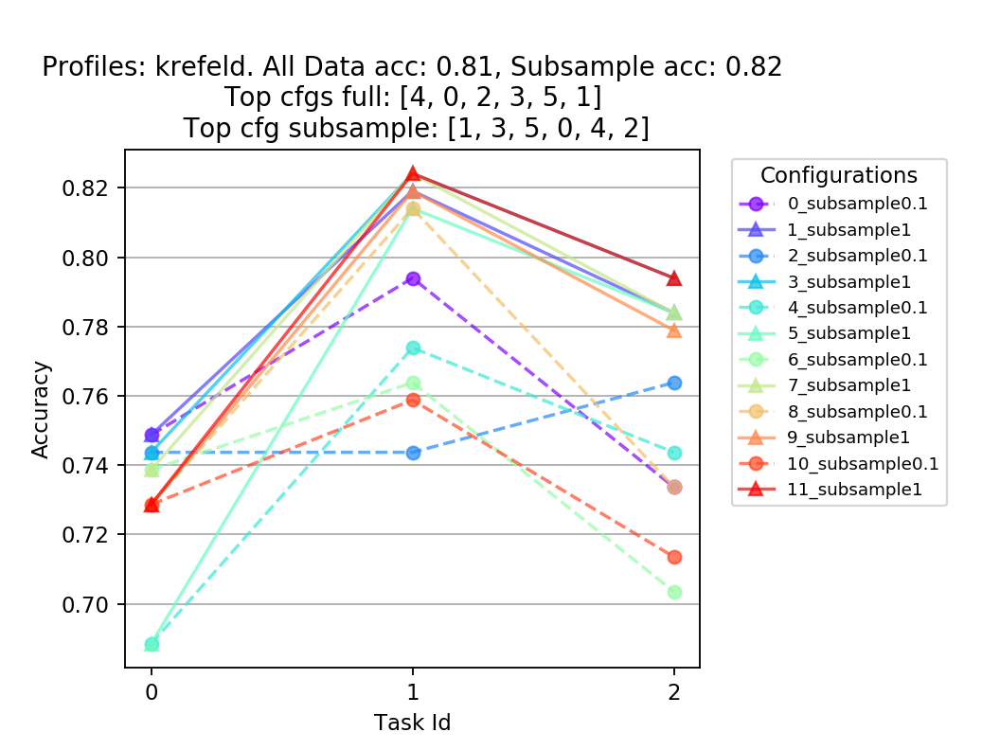

Intersection: [0, 1, 2, 3, 4, 5]
Full max acc:	0.81
Subsample Max acc:	0.82
Jaccard: 1.0


<IPython.core.display.Javascript object>


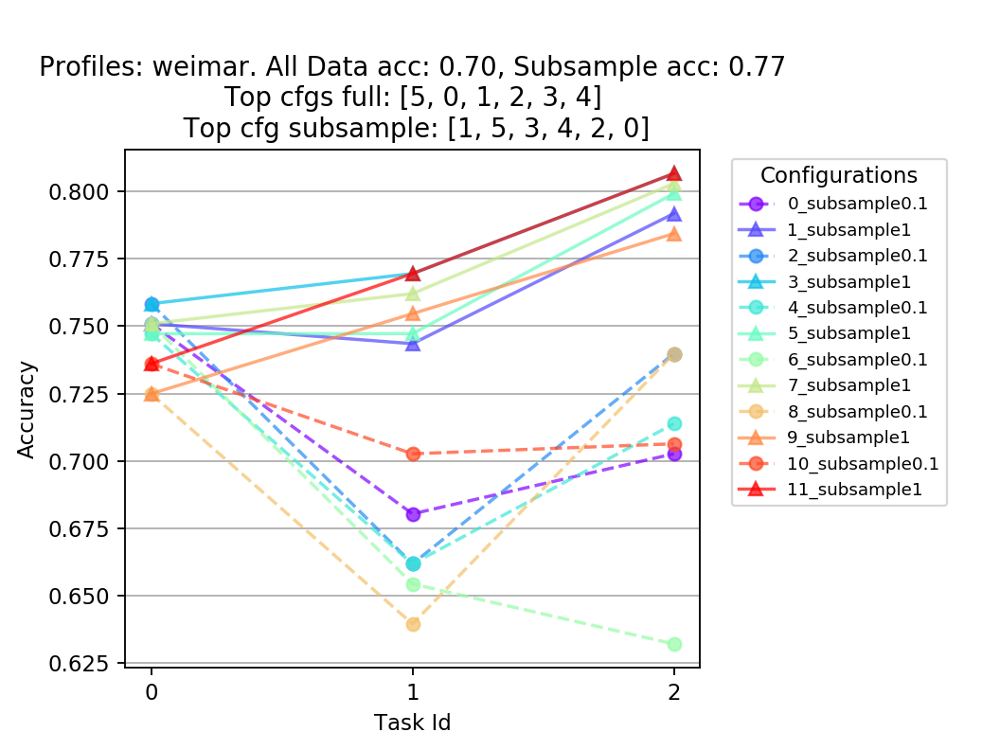

Intersection: [0, 1, 2, 3, 4, 5]
Full max acc:	0.70
Subsample Max acc:	0.77
Jaccard: 1.0


In [9]:
def get_top5(taskwise_acc_dict, taskid, topk=5):
    data = taskwise_acc_dict[taskid]
    hp_ids = sorted(data, key=data.get, reverse=True)[:topk]
    return hp_ids, [data[i] for i in hp_ids]


def without_keys(d, keys):
    return {x: d[x] for x in d if x not in keys}

for city in city_names:
    plt.figure()
    
    # Plot full data sample data
    city_path = os.path.join(data_root, city)
    retrain_result_files = (glob.glob(city_path + "/*_retraining_result.json"))
    hyperparam_ids = sorted([os.path.basename(x).split('_retraining_result.json')[0] for x in retrain_result_files],
                           key=int)
    
    # Read hyperparameter map
    with open(os.path.join(city_path, 'hyp_map.json')) as f:
        hyp_map = json.load(f)
        
    # Create a map of hyperparameters except "subsample" to id for comparison.  
    hyps = [without_keys(hyps, "subsample") for _, hyps in hyp_map.items()]
    hyp_unique_map = {}
    i = 0
    for h in hyps:
        if frozenset(h.items()) not in hyp_unique_map:
            hyp_unique_map[frozenset(h.items())] = i
            i+=1
    
    colors = iter(plt.cm.rainbow(np.linspace(0,1,len(hyperparam_ids))))
    taskwise_acc = defaultdict(lambda: defaultdict(dict))# First key is bool for "IsFullData"
    for hp_id in hyperparam_ids:
        hparams = hyp_map[hp_id]
        x,y = get_data(os.path.join(city_path, '{}_retraining_result.json'.format(hp_id)))
        if hparams["subsample"] < 1:
            linestyle = '--'
            marker = 'o'
        elif hparams["subsample"] == 1:
            linestyle = '-'
            marker = '^'
        plt.plot(x,y, label=hp_id + "_subsample{}".format(hparams["subsample"]), ls=linestyle,
                 marker=marker, color=next(colors), alpha=0.7)
        for t, acc in zip(x,y):
            taskwise_acc[hparams["subsample"] < 1][t][hp_id] = acc
    topk_full, accs_full = get_top5(taskwise_acc[True], 1, topk=10)
    topk_subsample, accs_subsample = get_top5(taskwise_acc[False], 1, topk=10)
    
    # Remap unique ids:
    topk_full = [hyp_unique_map[frozenset(without_keys(hyp_map[h_id], "subsample").items())] for h_id in topk_full]
    topk_subsample = [hyp_unique_map[frozenset(without_keys(hyp_map[h_id], "subsample").items())] for h_id in topk_subsample]
    
    plt.title("Profiles: {}. All Data acc: {:.2f}, Subsample acc: {:.2f}\nTop cfgs full: {}\n Top cfg subsample: {}".format(city, accs_full[0], accs_subsample[0], topk_full, topk_subsample))
    print("Intersection: {}\nFull max acc:\t{:.2f}\nSubsample Max acc:\t{:.2f}".format(list(set(topk_full) & set(topk_subsample)),
         accs_full[0], accs_subsample[0]))
    print("Jaccard: {}".format(len(list(set(topk_full) & set(topk_subsample)))/len(list(set(topk_full+topk_subsample)))))
    plt.ylabel("Accuracy")
    plt.xlabel("Task Id")
    num_tasks = len(x)
    plt.xticks(np.arange(num_tasks), [str(x) for x in range(num_tasks)])
    plt.gca().yaxis.grid(True)
    plt.subplots_adjust(top=0.8, right=0.7)
    plt.legend(bbox_to_anchor=(1.04,1), loc="upper left", ncol=1, title="Configurations", prop={'size': 8})
    plt.savefig(os.path.join(result_dir, '{}.png'.format(city)))

### Plot profiles

In [17]:
np.cumsum(profile['train_time'])

0       6.879642
1      13.769568
2      20.666218
3      27.563004
4      34.454651
5      41.351452
6      48.247183
7      55.139991
8      62.036620
9      68.933959
10     75.830568
11     82.722034
12     89.615771
13     96.510786
14    103.403013
15    110.300230
16    117.197484
17    124.093333
18    130.986631
19    137.882927
20    144.777022
21    151.674846
22    158.571872
23    165.469303
24    172.366086
25    179.260305
26    186.155782
27    193.052239
28    199.937839
29    206.828709
Name: train_time, dtype: float64

<IPython.core.display.Javascript object>


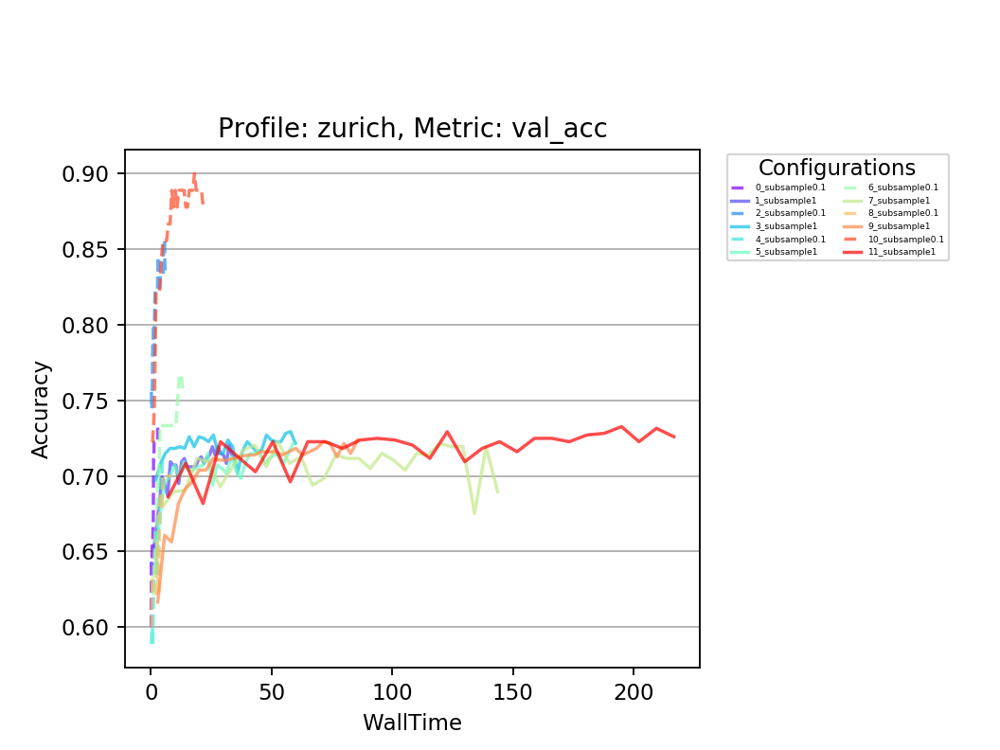

<IPython.core.display.Javascript object>


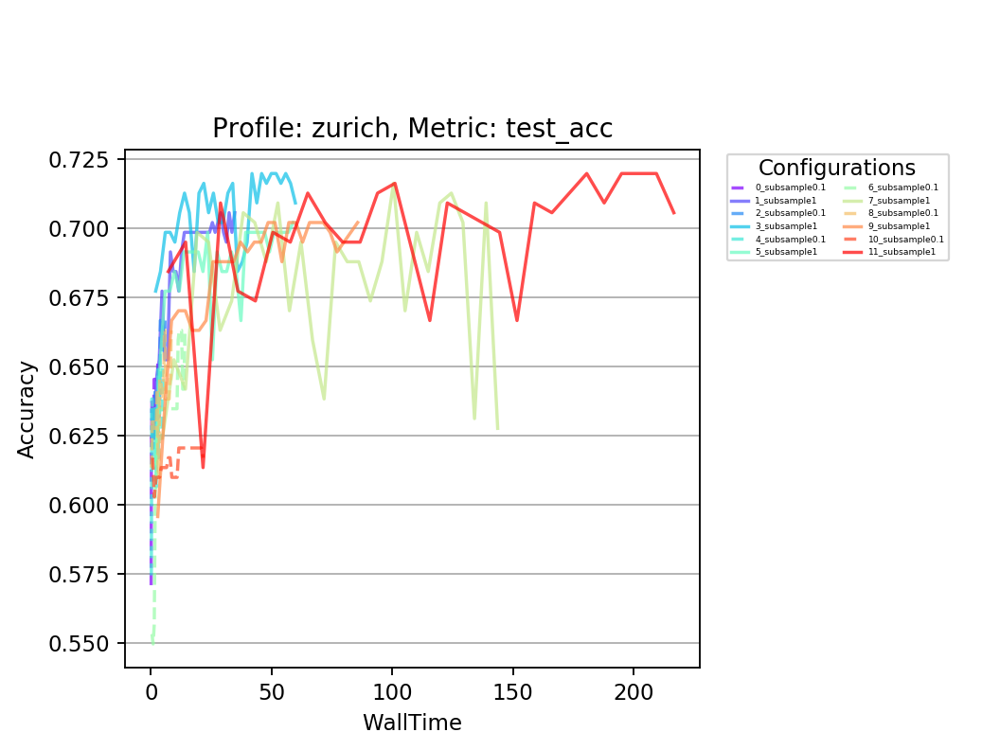

<IPython.core.display.Javascript object>


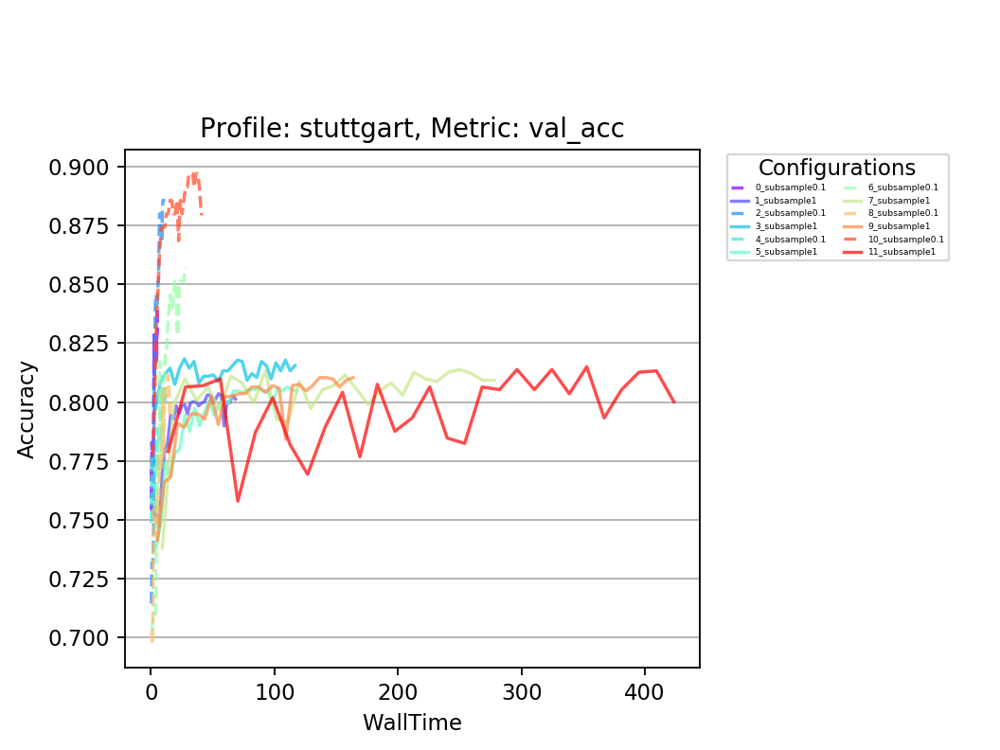

<IPython.core.display.Javascript object>


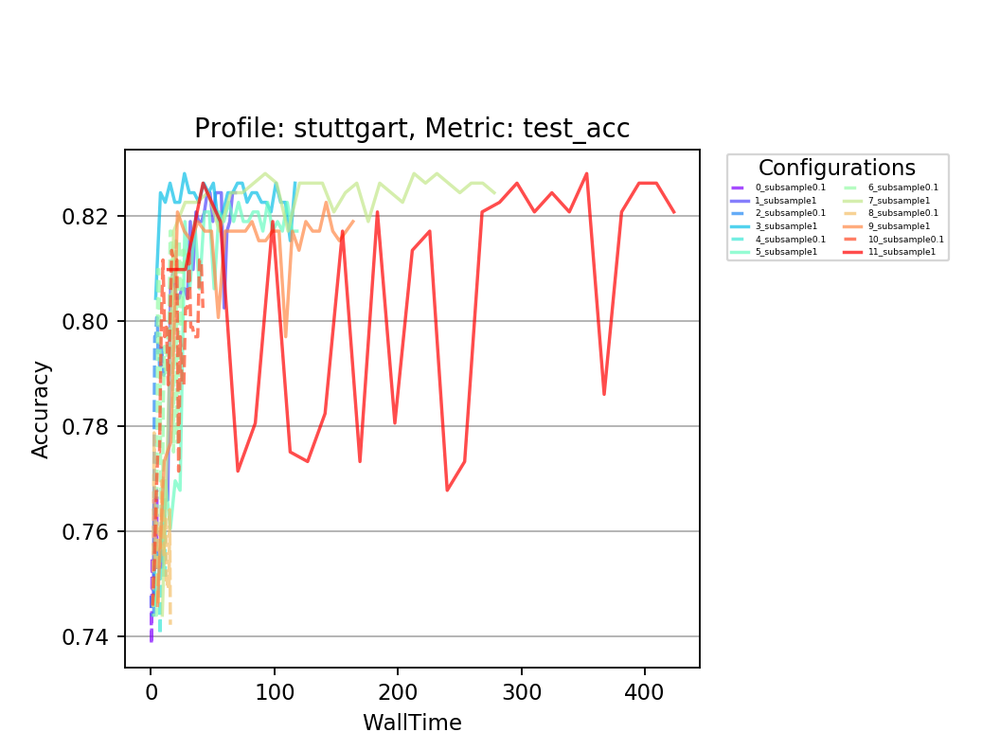

/home/romilb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


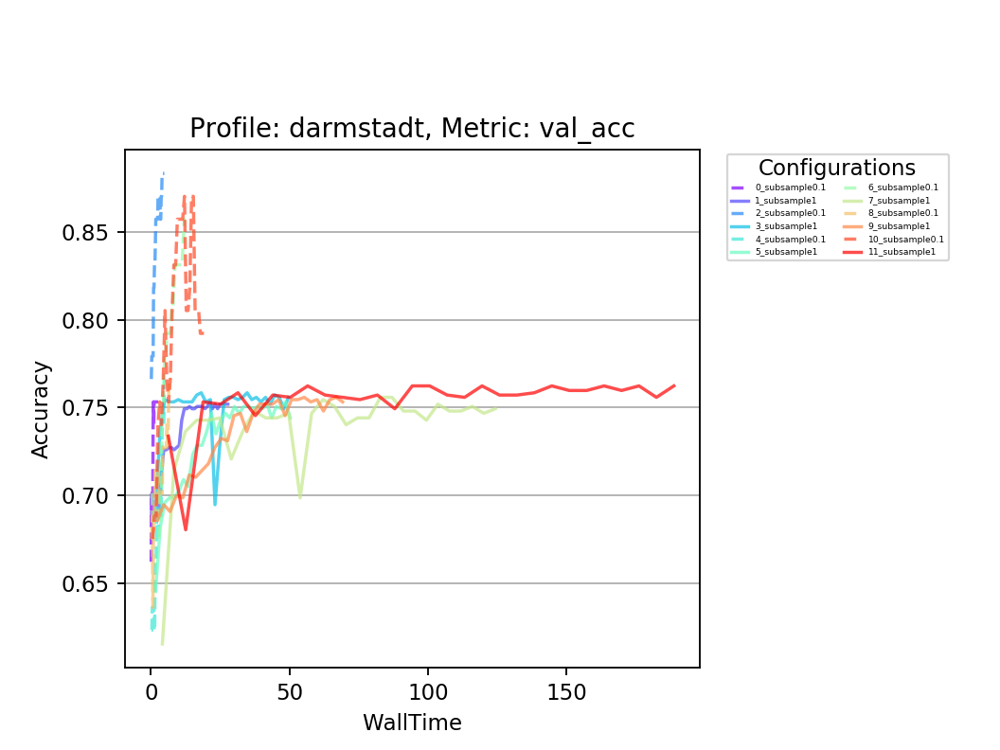

<IPython.core.display.Javascript object>


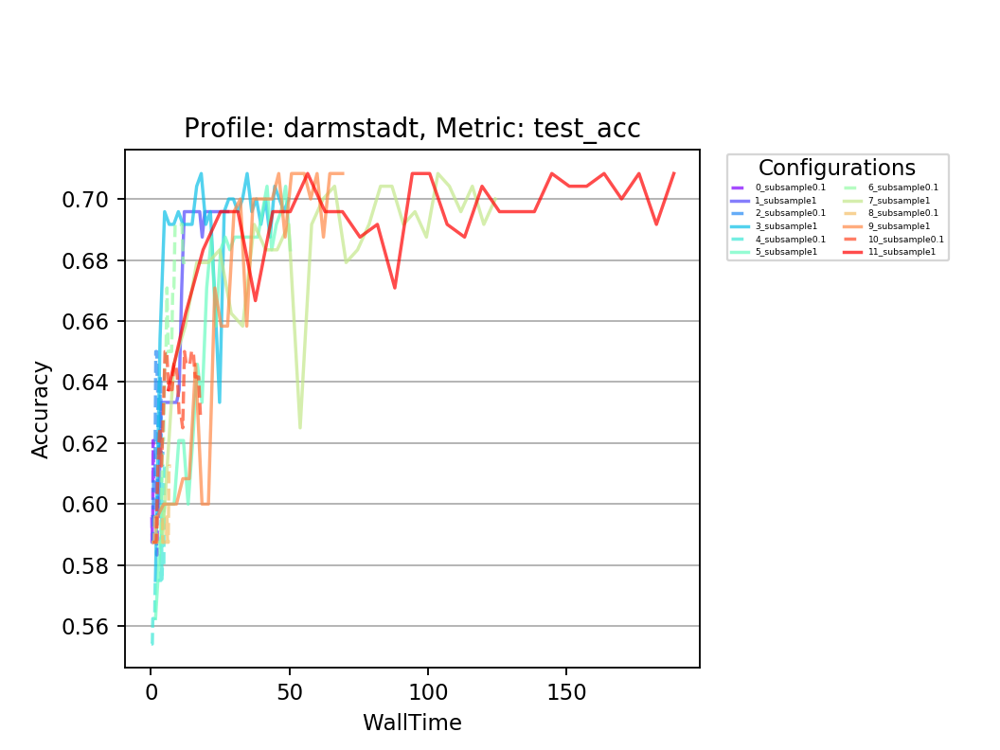

<IPython.core.display.Javascript object>


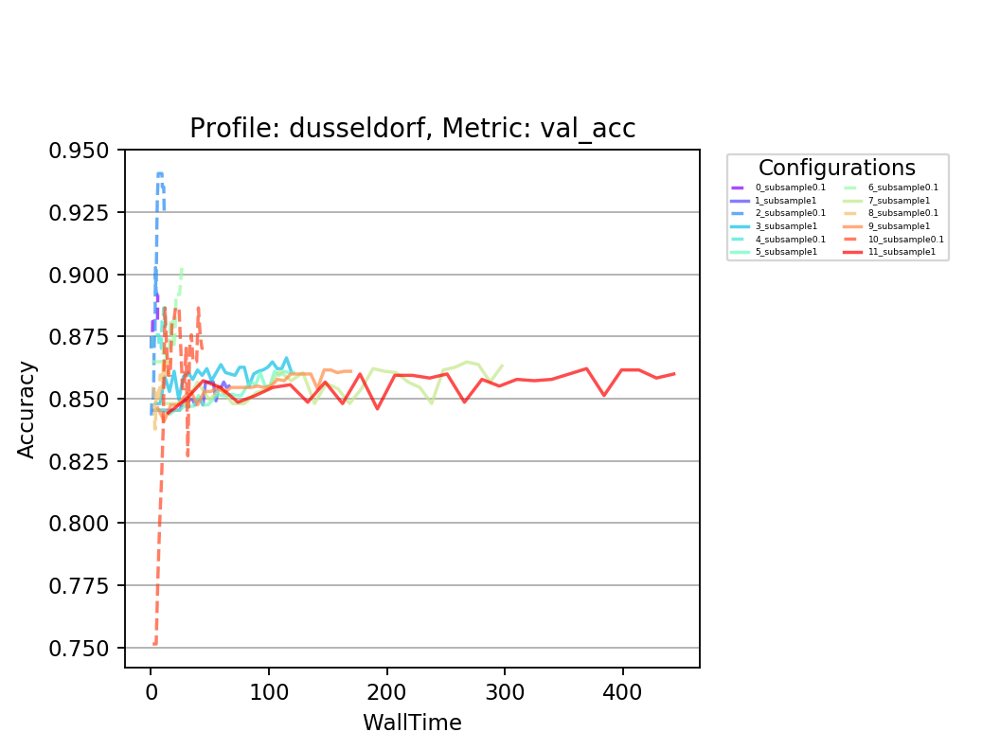

<IPython.core.display.Javascript object>


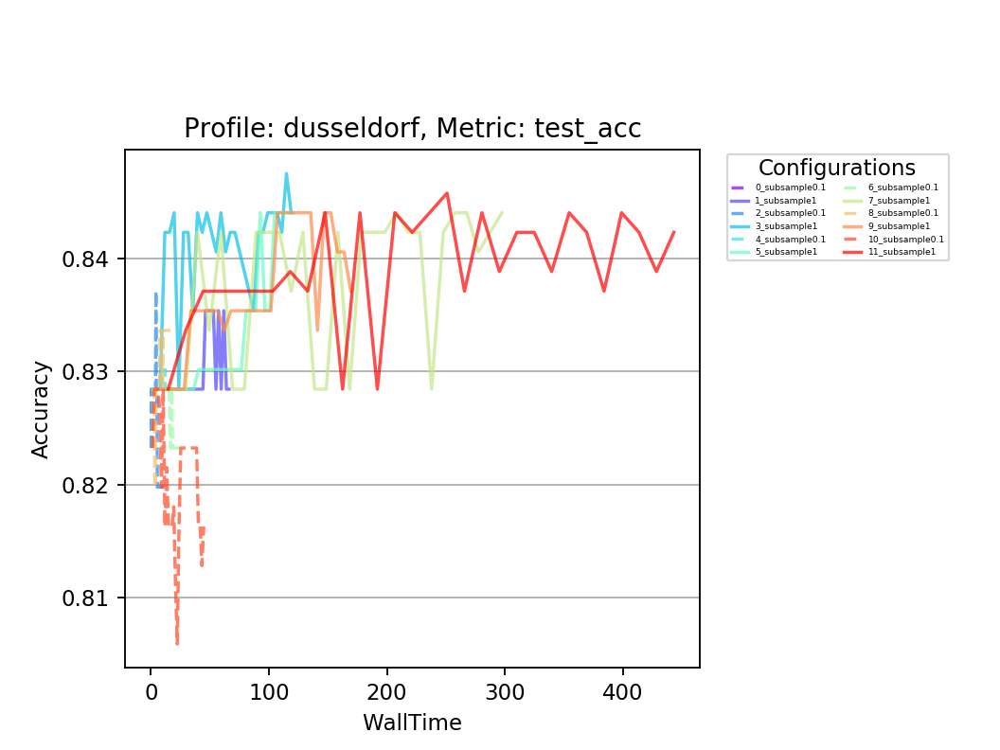

<IPython.core.display.Javascript object>


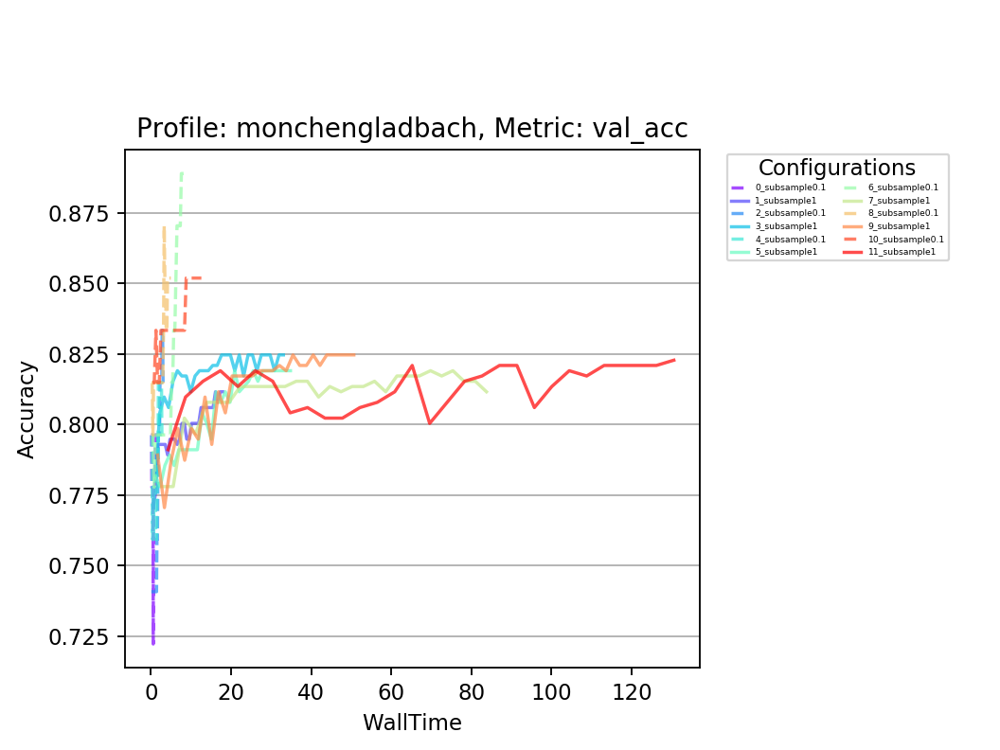

<IPython.core.display.Javascript object>


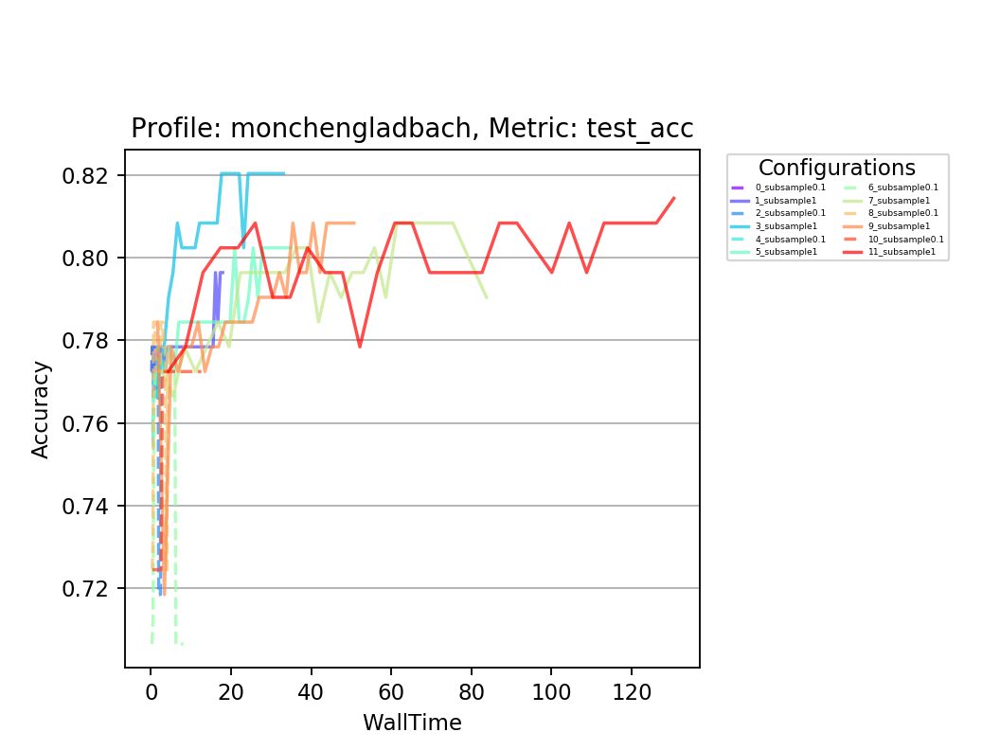

<IPython.core.display.Javascript object>


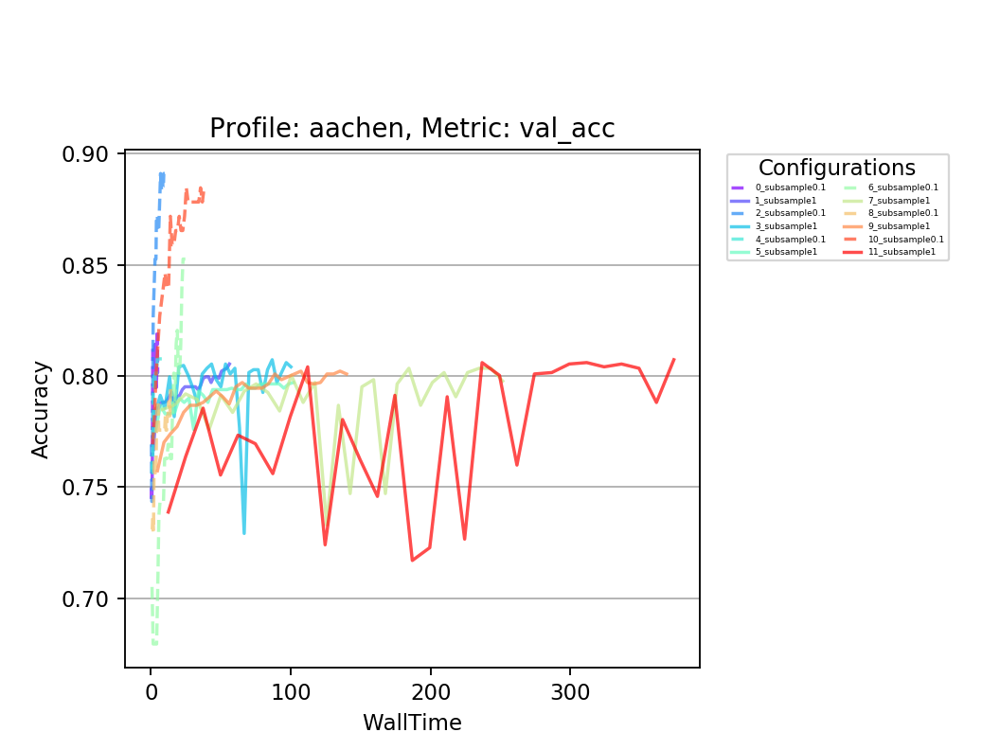

<IPython.core.display.Javascript object>


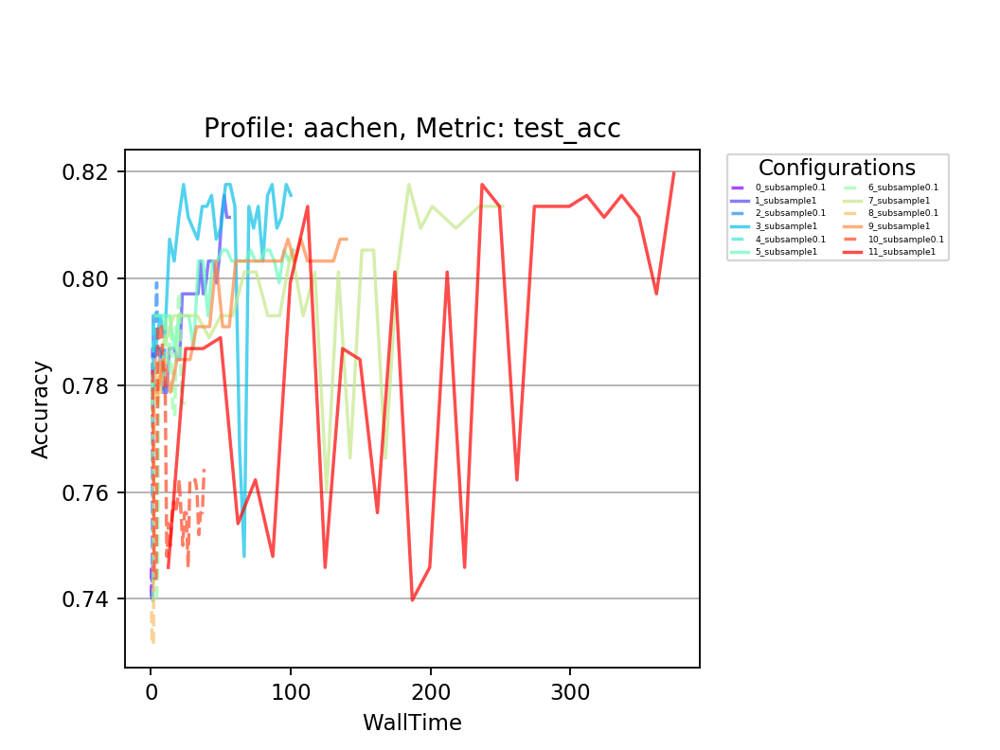

<IPython.core.display.Javascript object>


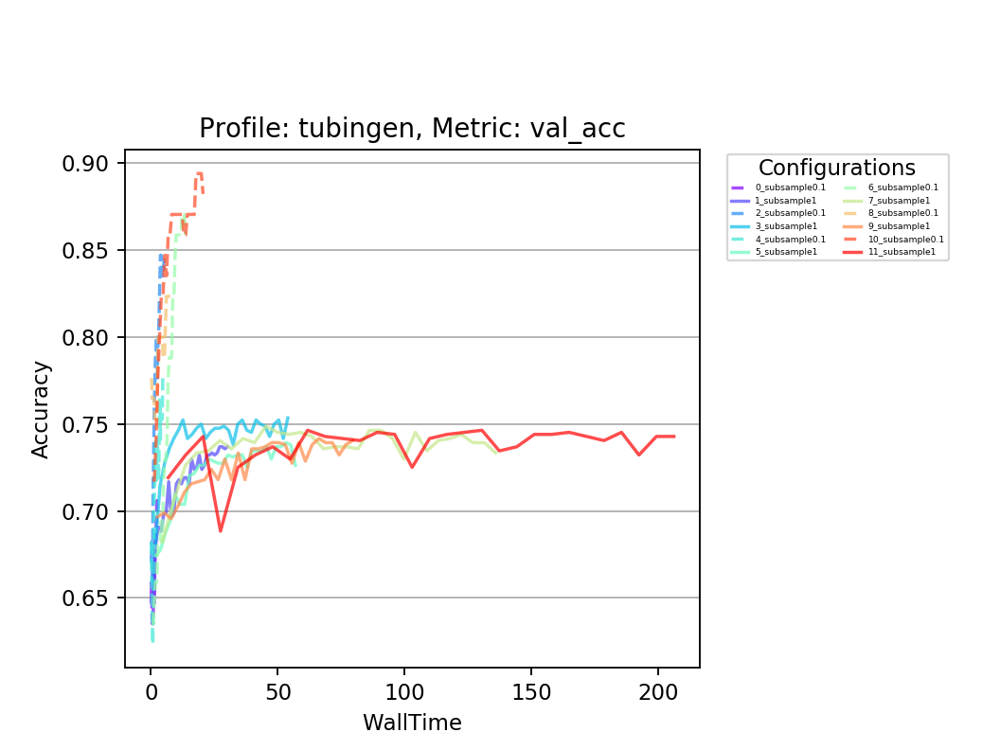

<IPython.core.display.Javascript object>


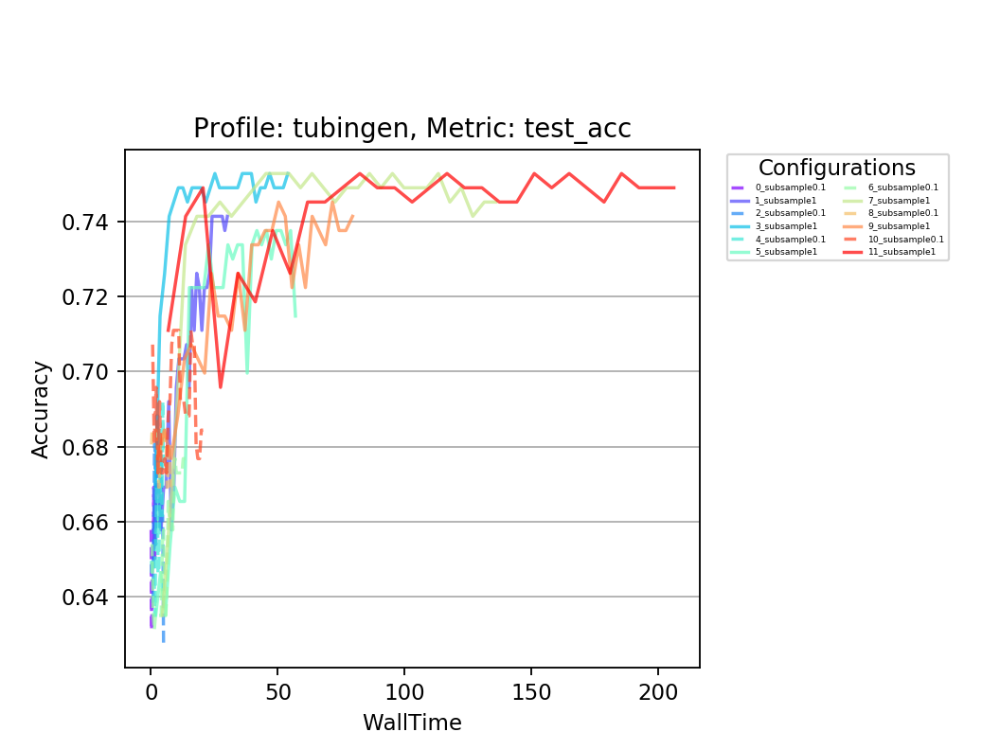

<IPython.core.display.Javascript object>


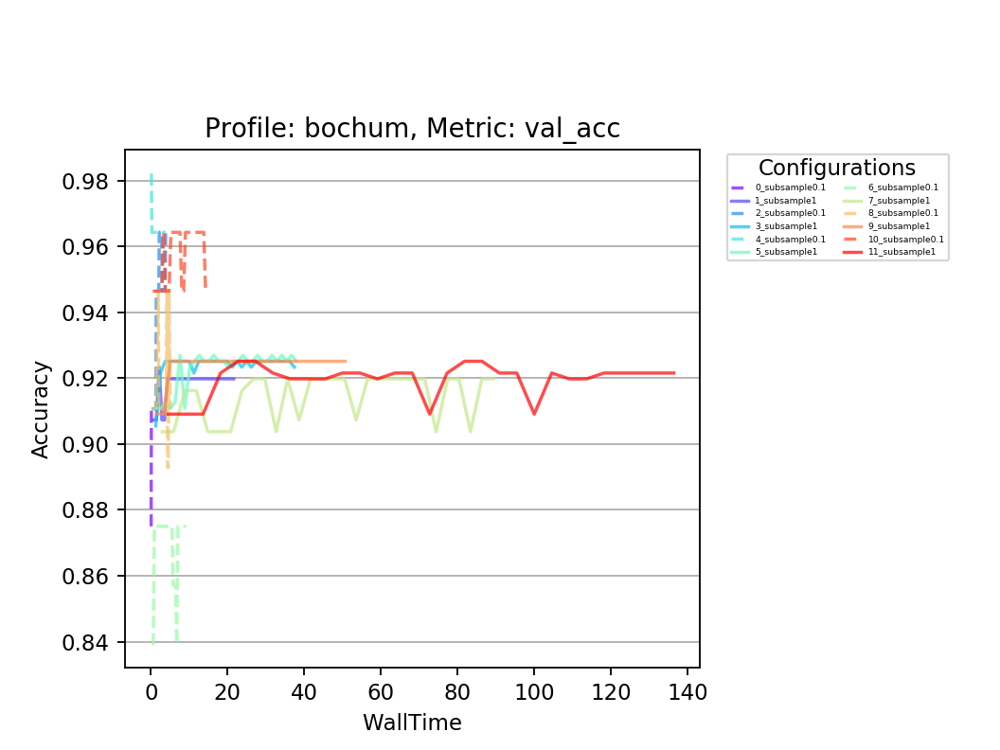

<IPython.core.display.Javascript object>


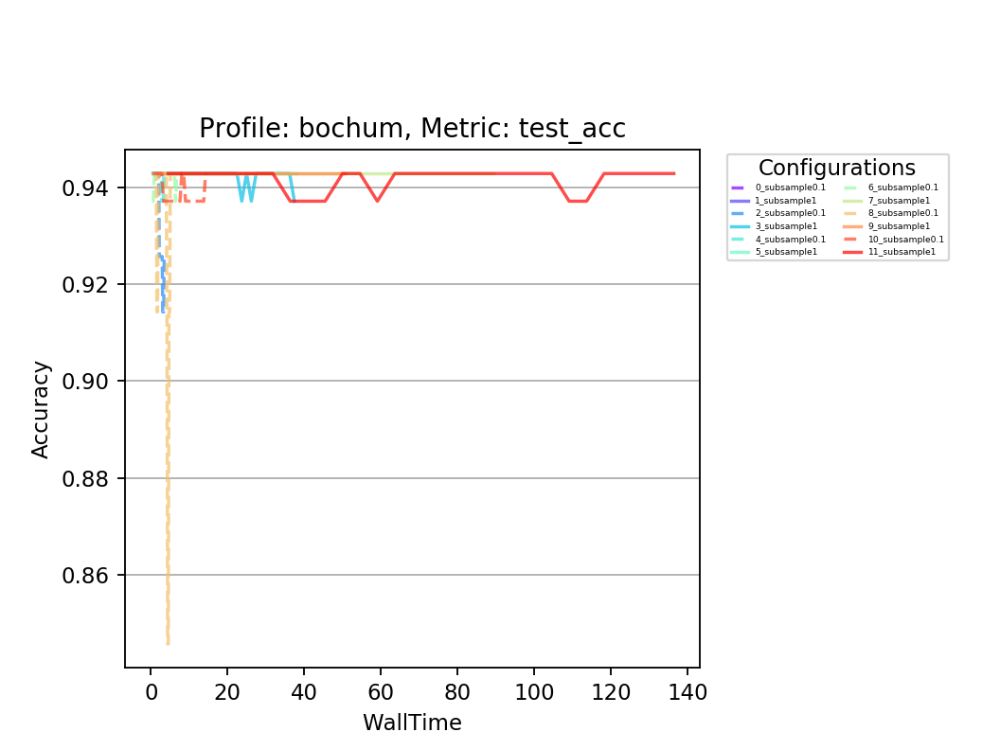

<IPython.core.display.Javascript object>


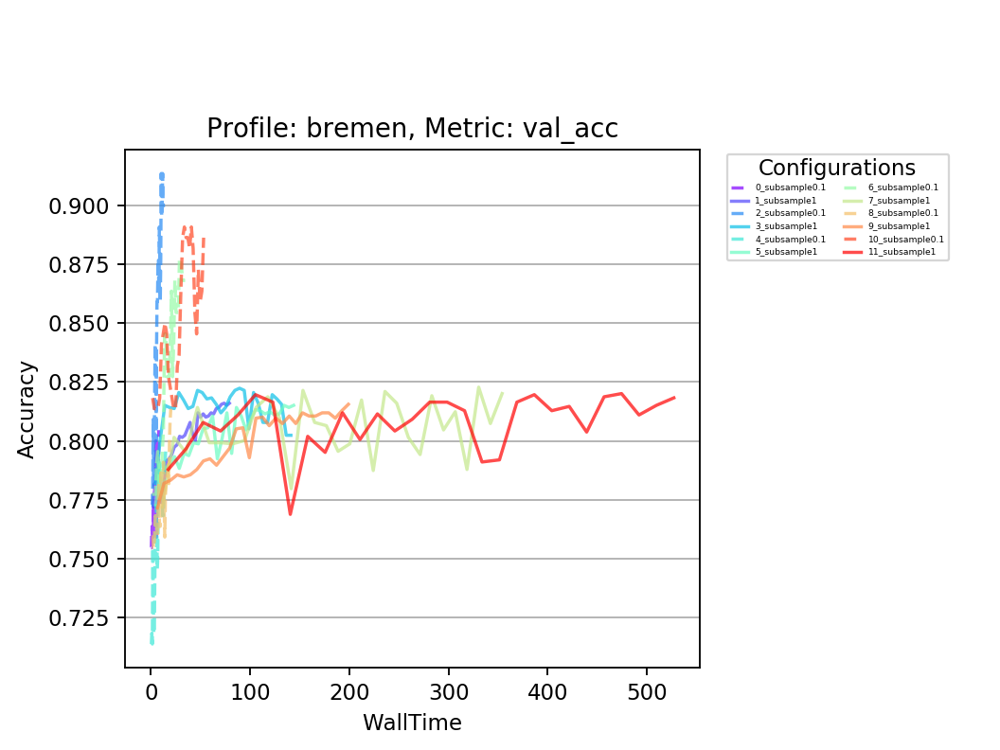

<IPython.core.display.Javascript object>


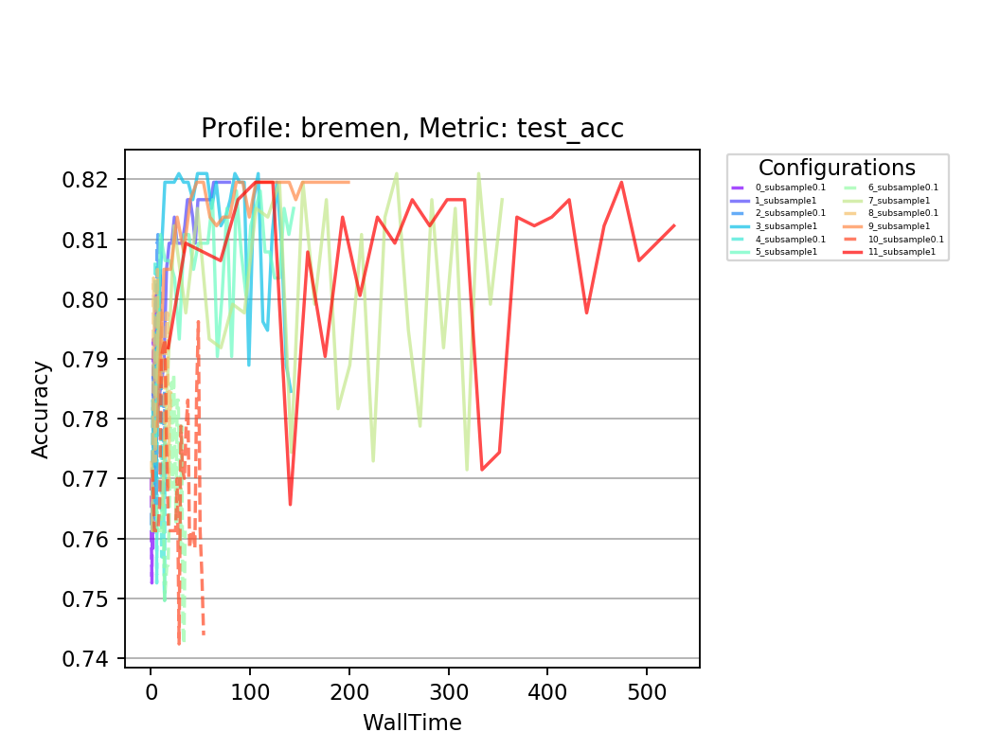

<IPython.core.display.Javascript object>


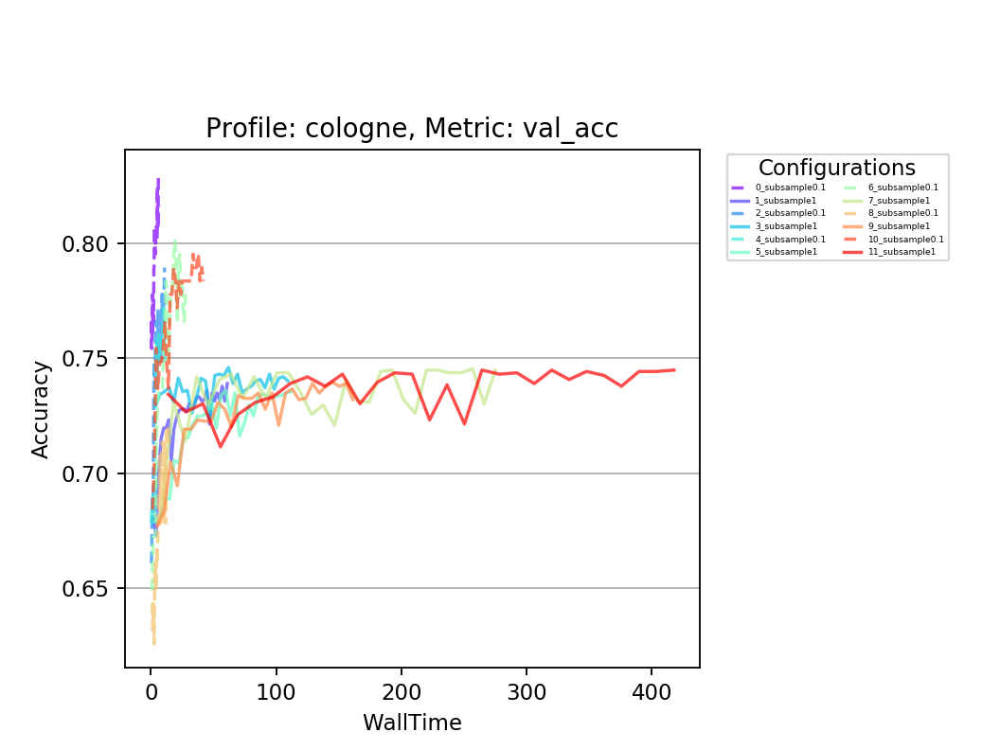

<IPython.core.display.Javascript object>


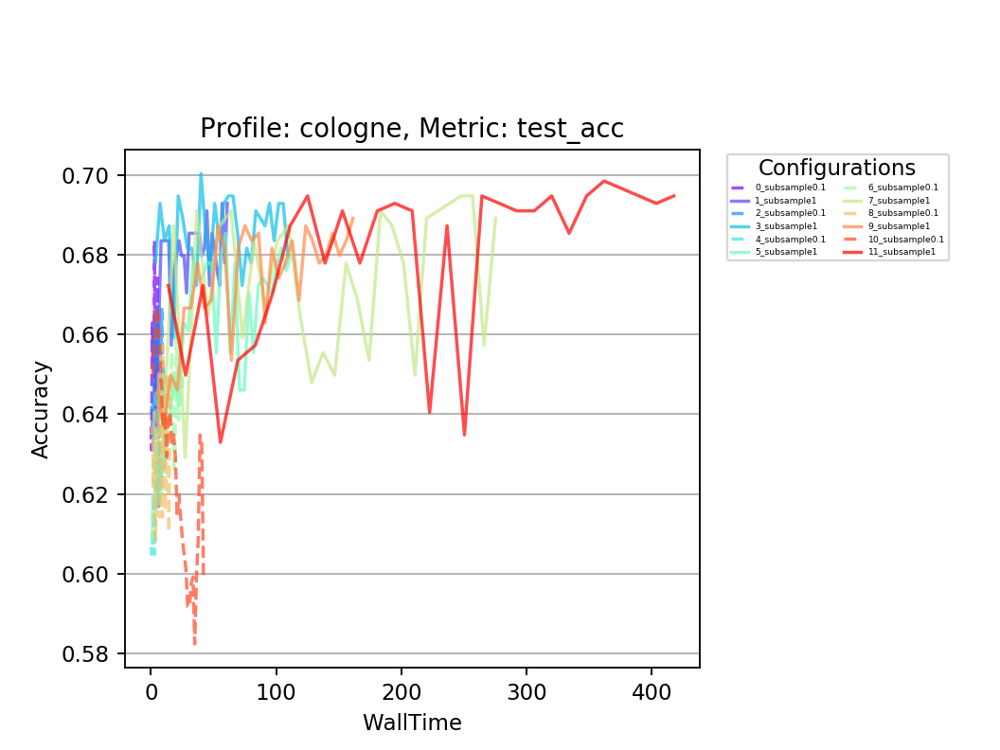

<IPython.core.display.Javascript object>


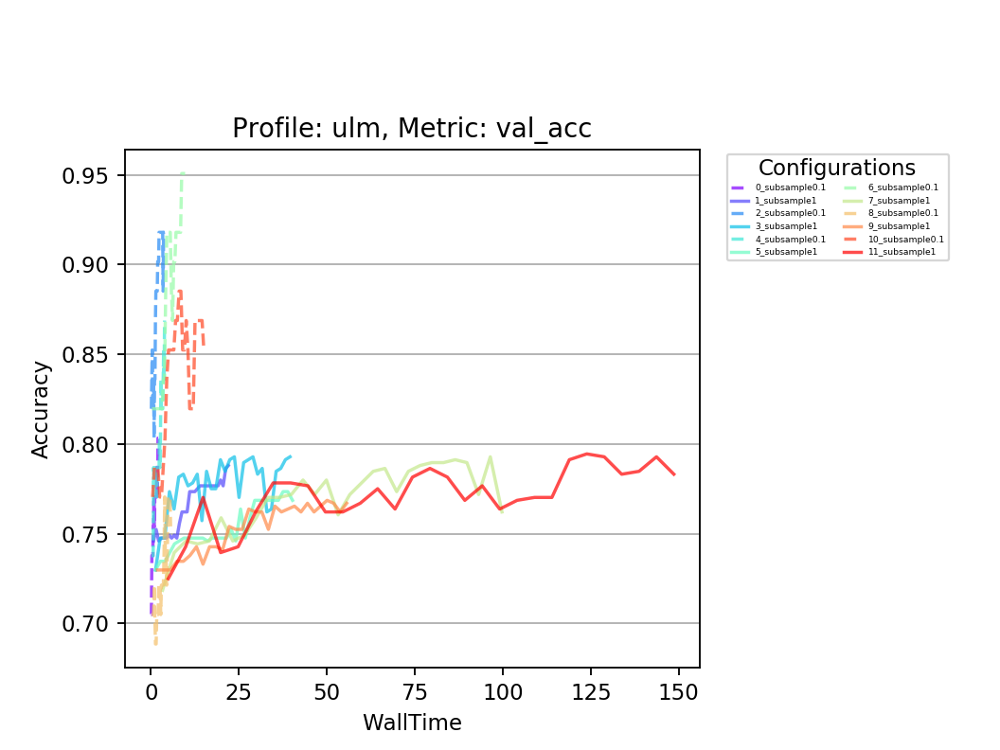

<IPython.core.display.Javascript object>


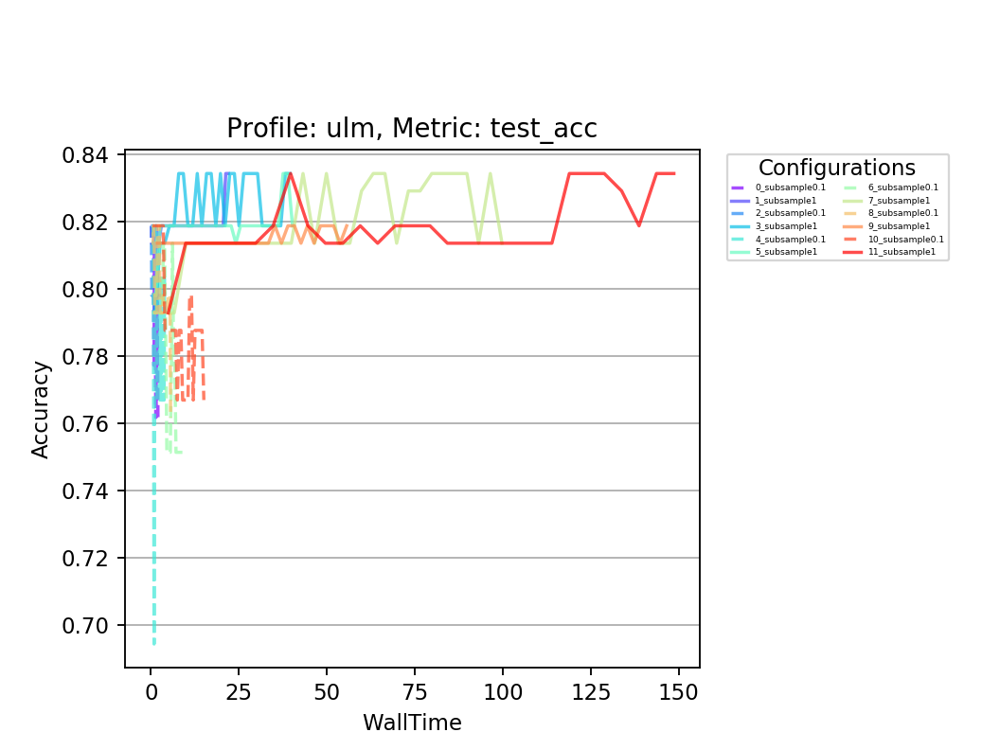

<IPython.core.display.Javascript object>


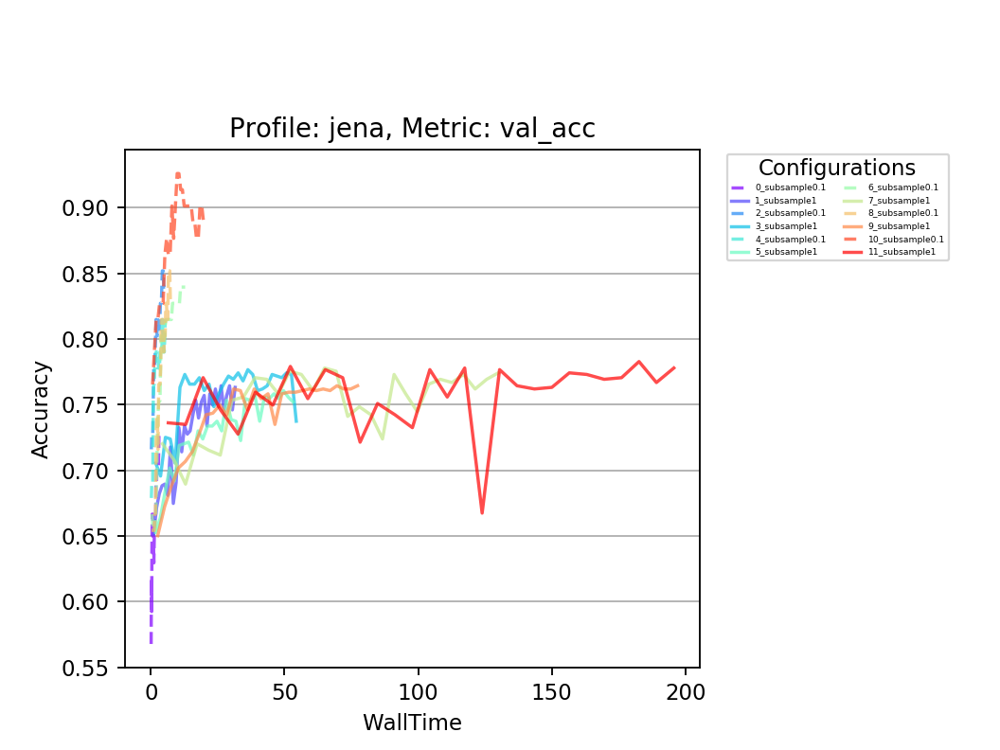

<IPython.core.display.Javascript object>


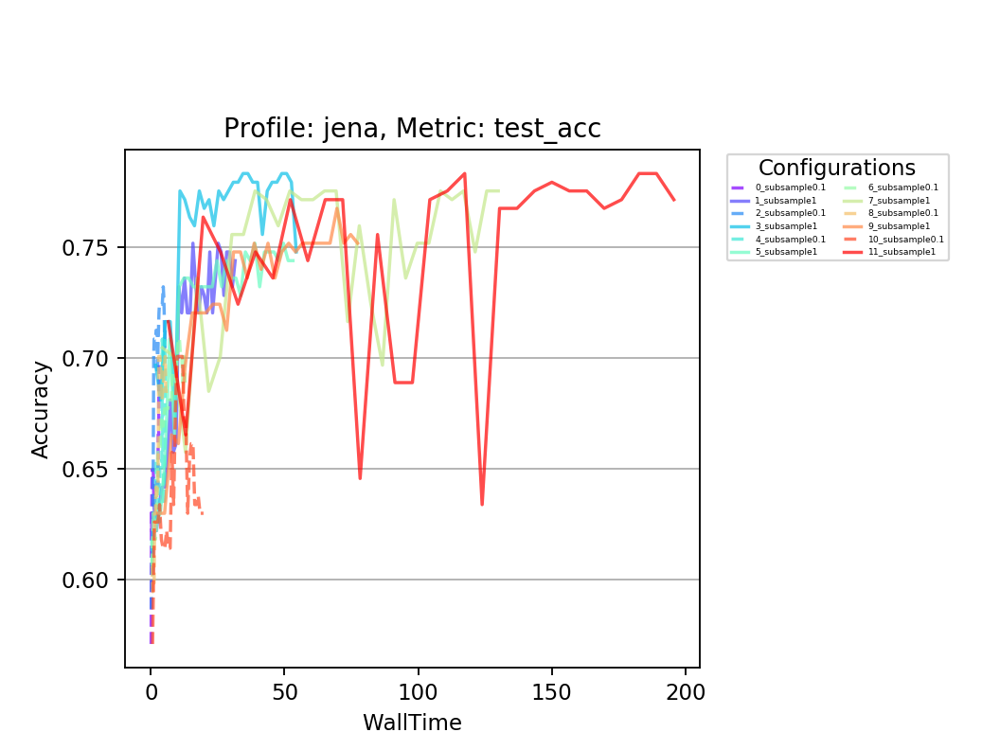

<IPython.core.display.Javascript object>


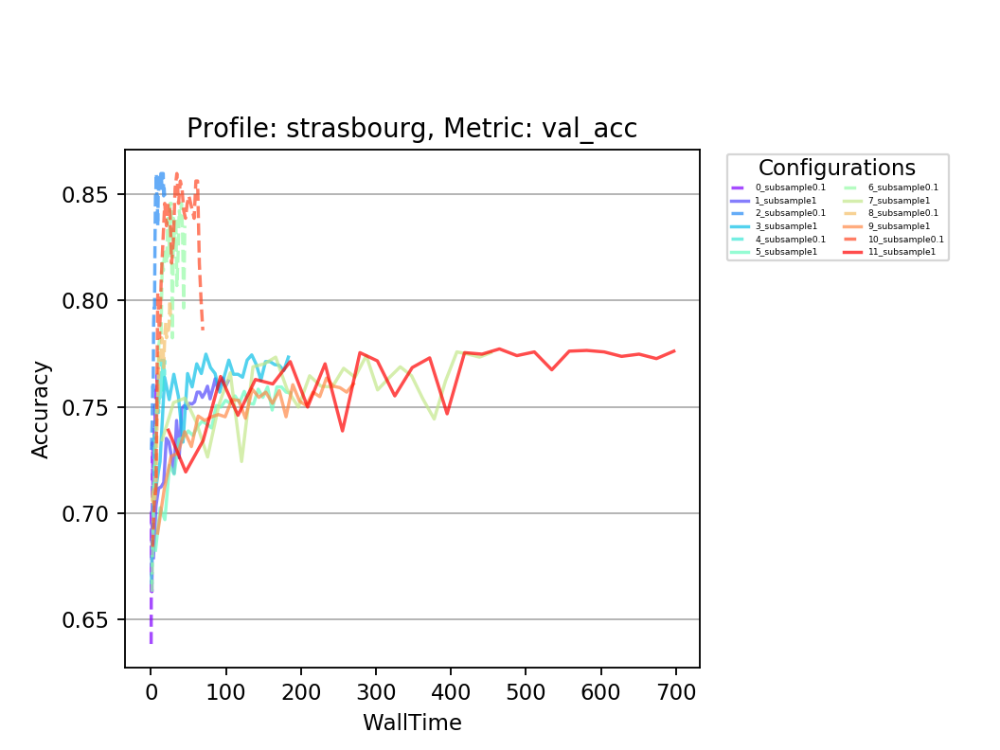

<IPython.core.display.Javascript object>


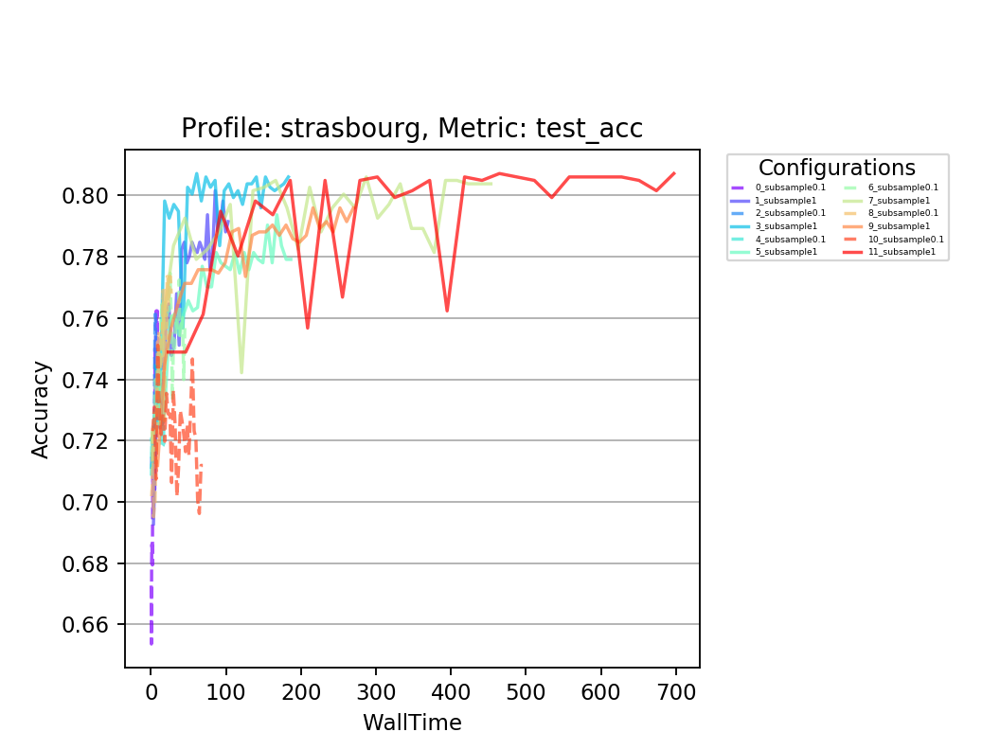

<IPython.core.display.Javascript object>


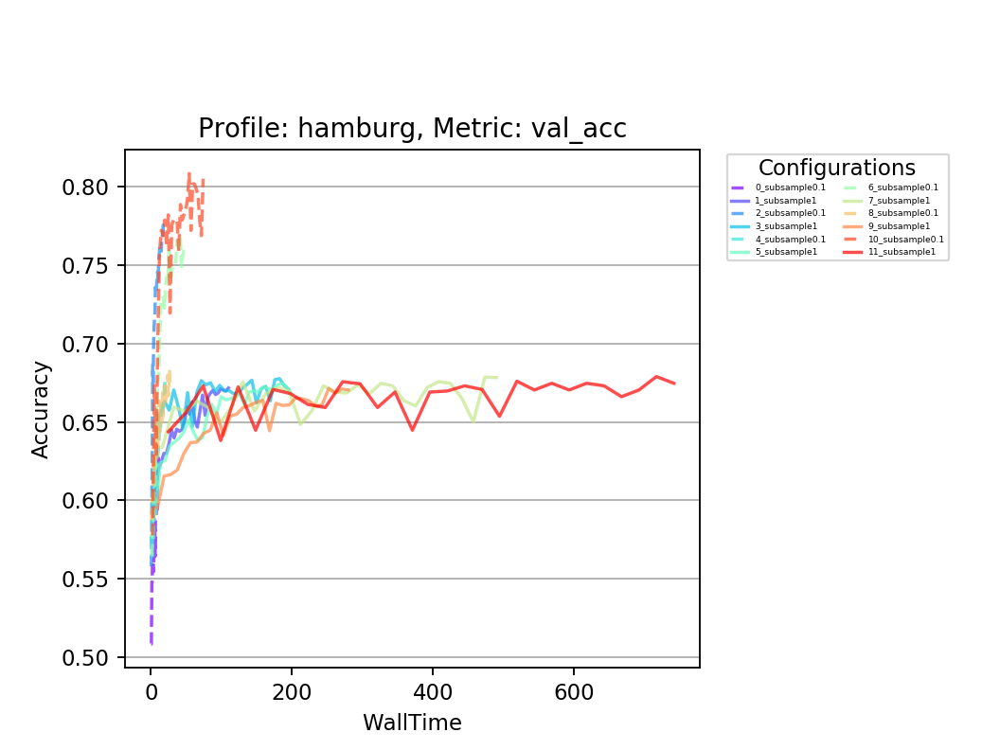

<IPython.core.display.Javascript object>


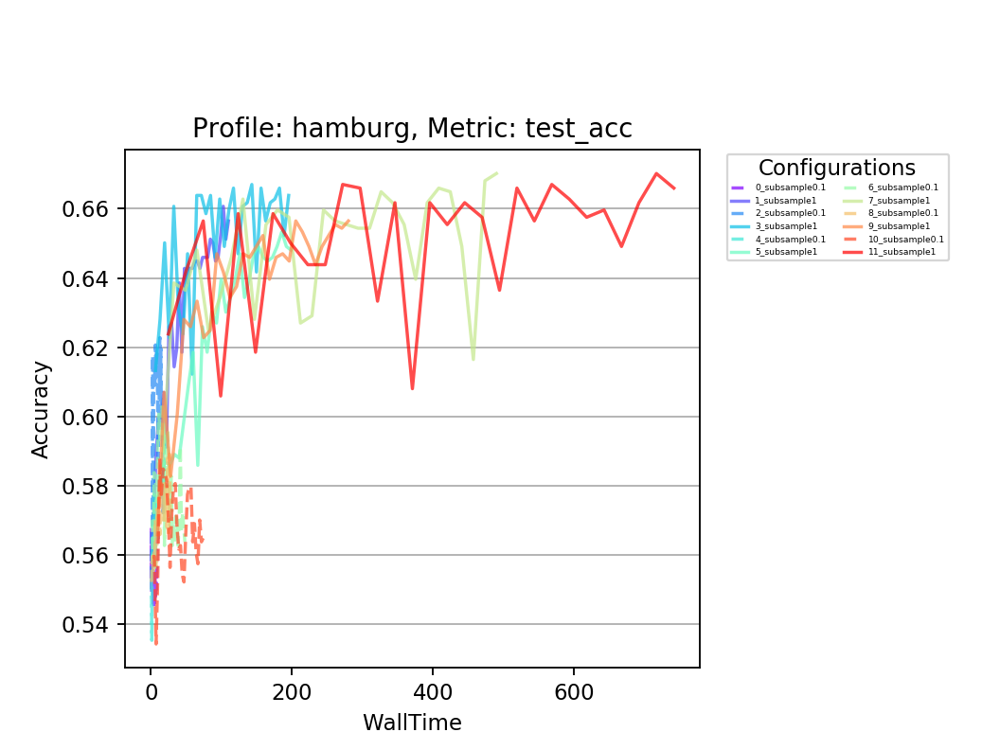

<IPython.core.display.Javascript object>


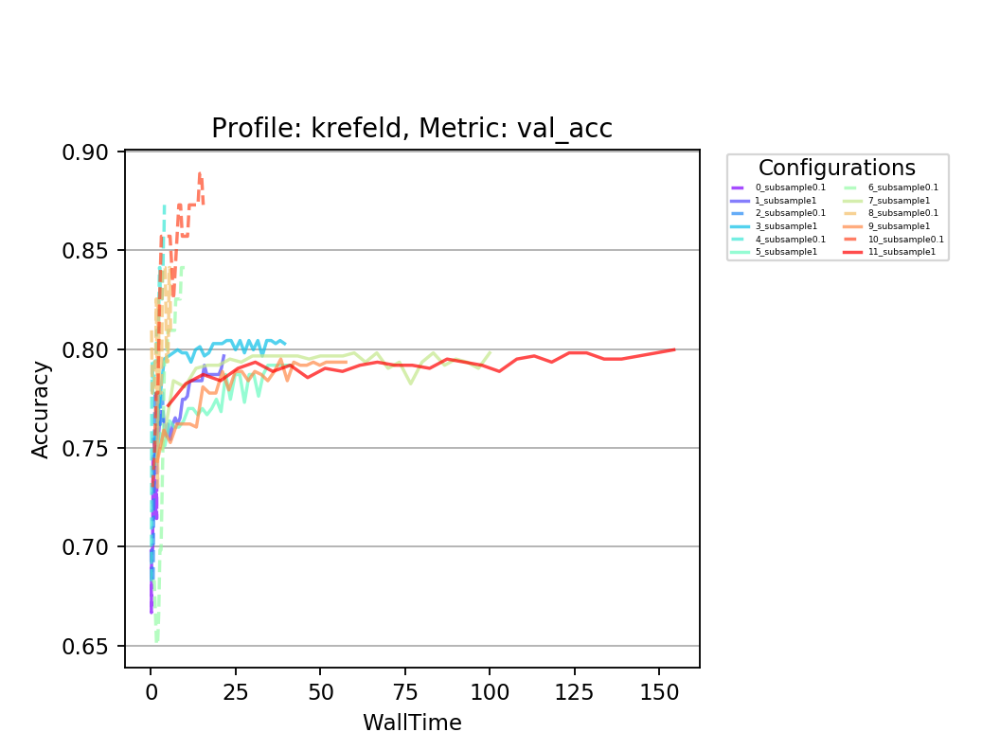

<IPython.core.display.Javascript object>


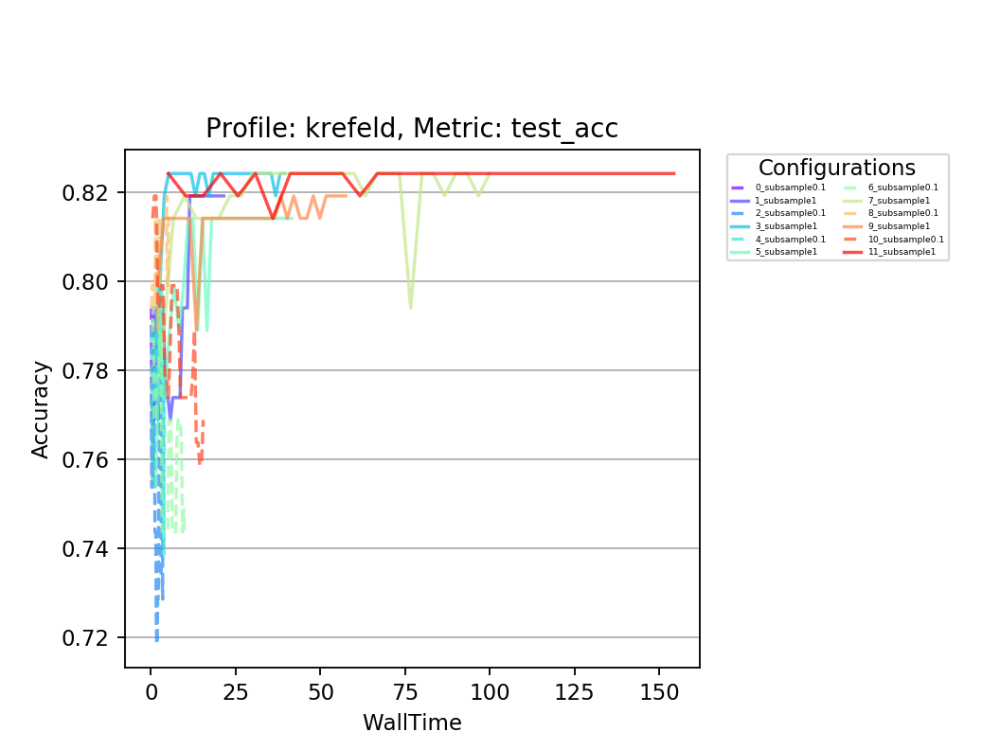

<IPython.core.display.Javascript object>


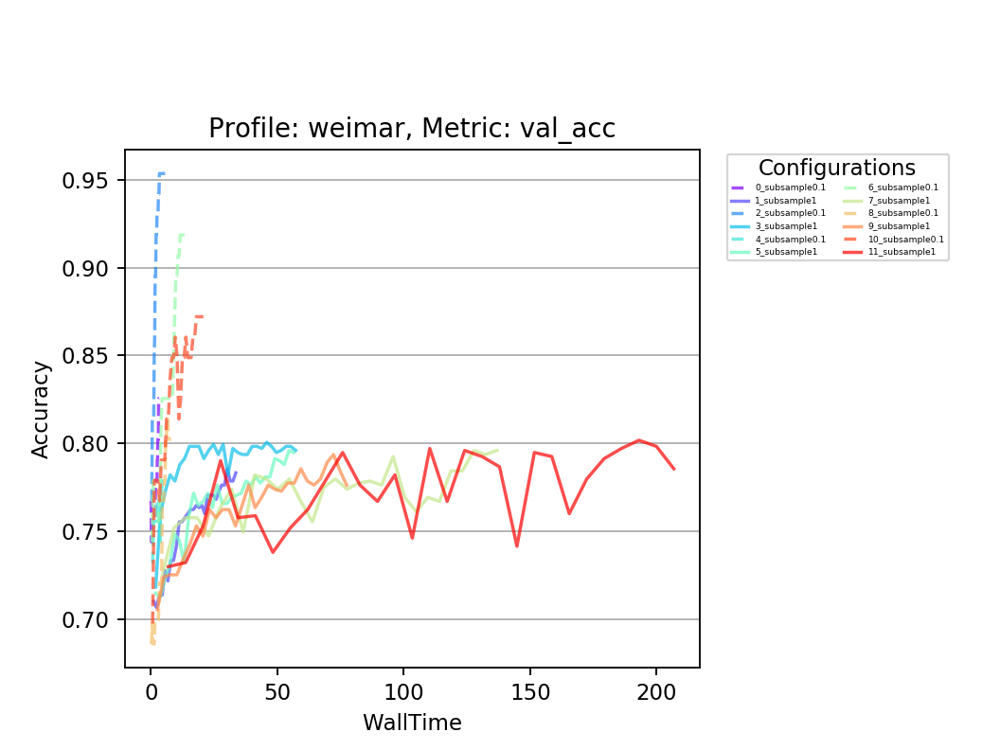

<IPython.core.display.Javascript object>


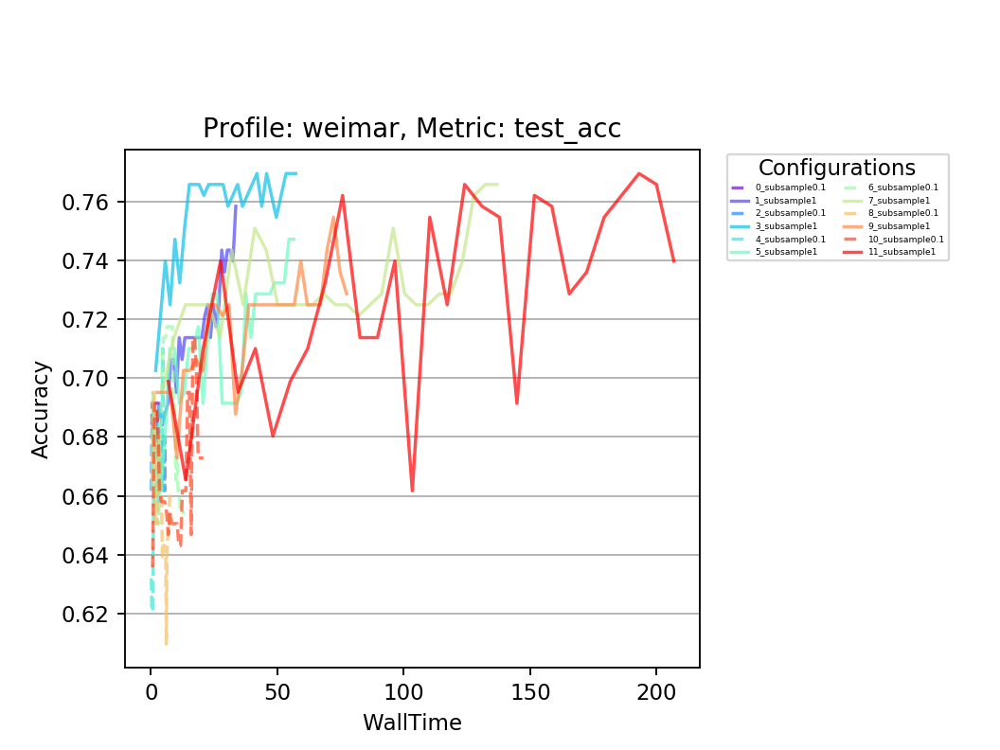

In [18]:
columns = ['start_time']
for phase in ["train","val","test"]:
    for metric in ['time', 'loss', 'acc', 'num_samples']:
        columns.append("{}_{}".format(phase, metric))

def get_profile(json_path):
    profile_data = {}
    with open(json_path) as json_file:
        data = json.load(json_file)
    for taskid, profile in data.items():
        profile_data[taskid] = pd.DataFrame(profile, columns = columns)
    return profile_data


TASK = "1"
METRICS = ["val_acc", "test_acc"]

for city in city_names:
    for metric_to_plot in METRICS:
        plt.figure()

        # Plot full data sample data
        city_path = os.path.join(data_root, city)
        retrain_result_files = (glob.glob(city_path + "/*_retraining_result.json"))
        hyperparam_ids = sorted([os.path.basename(x).split('_retraining_result.json')[0] for x in retrain_result_files],
                               key=int)

        # Read hyperparameter map
        with open(os.path.join(city_path, 'hyp_map.json')) as f:
            hyp_map = json.load(f)

        colors = iter(plt.cm.rainbow(np.linspace(0,1,len(hyperparam_ids))))
        for hp_id in hyperparam_ids:
            hparams = hyp_map[hp_id]
            profile = get_profile(os.path.join(city_path, '{}_profile.json'.format(hp_id)))[TASK]
            if hparams["subsample"] < 1:
                linestyle = '--'
                marker = 'o'
            elif hparams["subsample"] == 1:
                linestyle = '-'
                marker = '^'
            plt.plot(np.cumsum(profile['train_time']), profile[metric_to_plot], label=hp_id + "_subsample{}".format(hparams["subsample"]), ls=linestyle, color=next(colors), alpha=0.7)

        plt.title("Profile: {}, Metric: {}".format(city, metric_to_plot))
        plt.ylabel("Accuracy")
        plt.xlabel("WallTime")
        plt.gca().yaxis.grid(True)
        plt.subplots_adjust(top=0.8, right=0.7)
        plt.legend(bbox_to_anchor=(1.04,1), loc="upper left", ncol=2, title="Configurations", prop={'size': 4})
        #plt.savefig(os.path.join(result_dir, '{}.png'.format(city)))

## Generate jobs from curves and plot their resource-acc curve

/home/romilb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


<IPython.core.display.Javascript object>


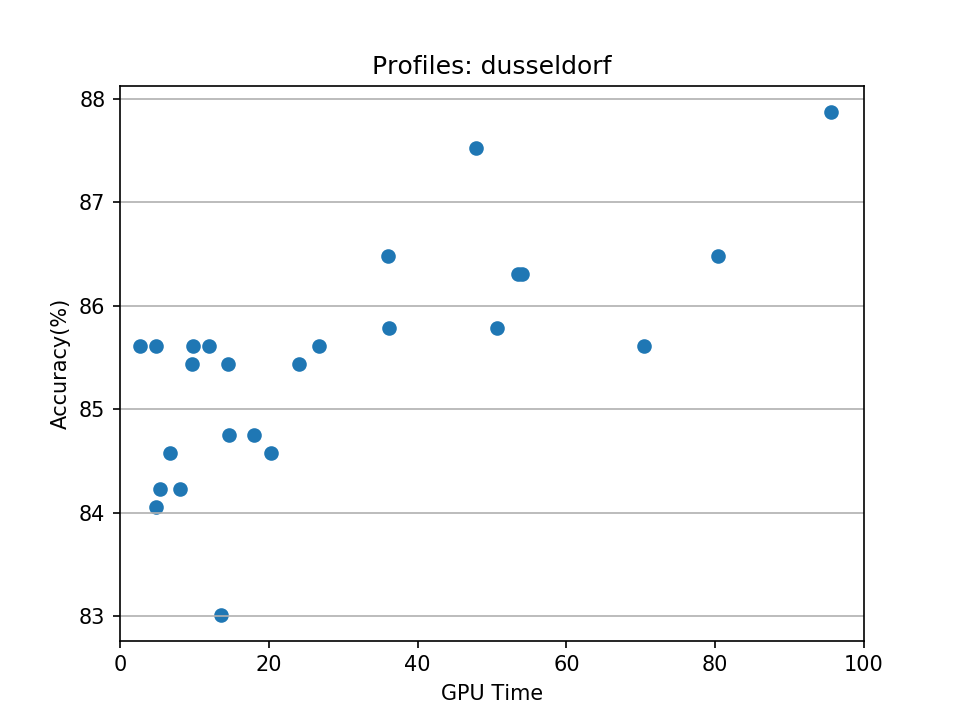

/home/romilb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


<IPython.core.display.Javascript object>


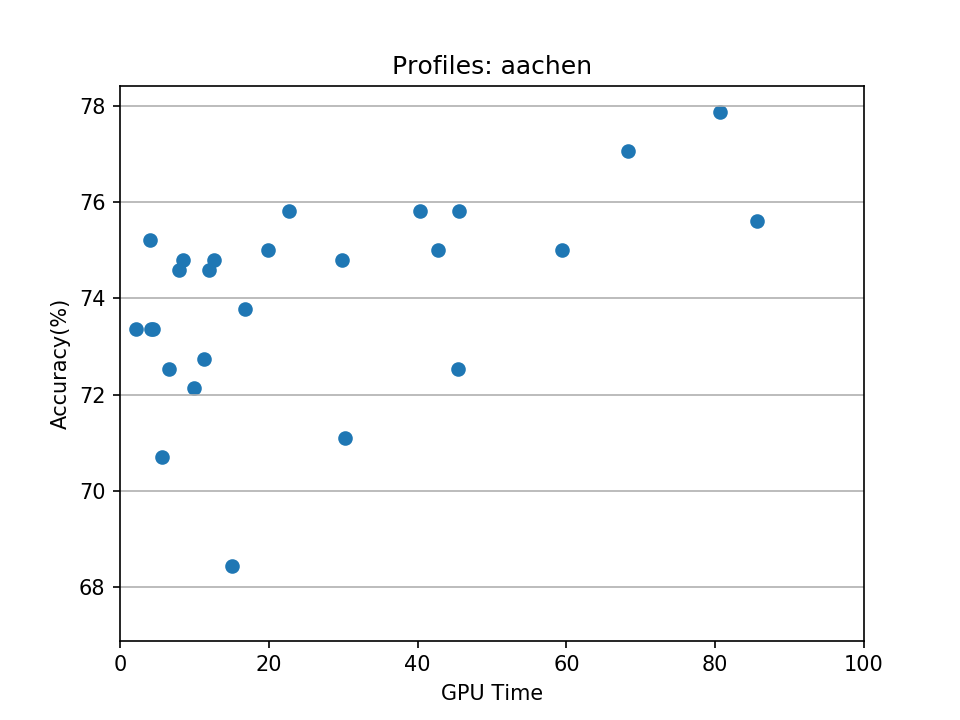

In [62]:
metric_to_plot = 'test_acc'
NUM_PROFILES_PER_CURVE = 3
TASK = "2"

#cities_to_plot = city_names
cities_to_plot = ['dusseldorf', 'aachen']

for city in cities_to_plot:
    jobs = []
    plt.figure()

    # Plot full data sample data
    city_path = os.path.join(data_root, city)
    retrain_result_files = (glob.glob(city_path + "/*_retraining_result.json"))
    hyperparam_ids = sorted([os.path.basename(x).split('_retraining_result.json')[0] for x in retrain_result_files],
                           key=int)

    # Read hyperparameter map
    with open(os.path.join(city_path, 'hyp_map.json')) as f:
        hyp_map = json.load(f)
        
        
    start_acc = get_data(os.path.join(city_path, '{}_retraining_result.json'.format(hp_id)))[1][(int(TASK)-1)]
        
    for hp_id in hyperparam_ids:
        hparams = hyp_map[hp_id]
        profile = get_profile(os.path.join(city_path, '{}_profile.json'.format(hp_id)))[TASK]
        num_epochs = len(profile['train_time'])
        
        time_elapsed = np.cumsum(profile['train_time'])
        metric = profile[metric_to_plot]
        
        skip = int(num_epochs/NUM_PROFILES_PER_CURVE)
        for i in range(0,num_tasks):
            idx = skip*(i+1)-1
            job = {'train_time': time_elapsed[idx], metric_to_plot: metric[idx]}
            jobs.append(job)
        
    time_data = [j['train_time'] for j in jobs] 
    acc_data = [j[metric_to_plot]*100 for j in jobs]
    plt.scatter(time_data, acc_data)
        
    plt.title("Profiles: {}".format(city, metric_to_plot))
    plt.ylabel("Accuracy(%)")
    plt.xlabel("GPU Time")
    plt.gca().yaxis.grid(True)
    #plt.ylim([0,1])
    plt.xlim([0,100])
    plt.savefig(os.path.join(result_dir, '{}.pdf'.format(city)))